In [1]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:37253")
client

<Client: 'tcp://127.0.0.1:37253' processes=7 threads=7, memory=187.52 GiB>

In [2]:
import numpy as np
import xarray as xr
import os.path as op
import gcm_filters
from xhistogram.xarray import histogram as xhist
from xgcm.grid import Grid
import gsw
from scipy.interpolate import griddata
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader

import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
ddir = '/bettik/PROJECTS/pr-data-ocean/COMMON/SWOT-FSP/'
savedir = '/bettik/uchidat/SWOT/'

In [4]:
fbase = 'SWOT_L3_LR_SSH_Basic_'
fnames = [
    '541_001_20230603T113421_20230603T122526_v0.1.nc',
    '541_002_20230603T122527_20230603T131632_v0.1.nc',
    '541_003_20230603T131632_20230603T140737_v0.1.nc',
    '541_004_20230603T140738_20230603T145843_v0.1.nc',
    '541_005_20230603T145843_20230603T154949_v0.1.nc',
    '541_006_20230603T154949_20230603T164055_v0.1.nc',
    '541_007_20230603T164055_20230603T173201_v0.1.nc',
    '541_008_20230603T173201_20230603T182305_v0.1.nc',
    '541_009_20230603T182306_20230603T191411_v0.1.nc',
    '541_010_20230603T191412_20230603T200517_v0.1.nc',
    '541_011_20230603T200517_20230603T205623_v0.1.nc',
    '541_012_20230603T205623_20230603T214729_v0.1.nc',
    '541_013_20230603T214729_20230603T223835_v0.1.nc',
    '541_014_20230603T223835_20230603T232940_v0.1.nc',
    '541_015_20230603T232940_20230604T002045_v0.1.nc',
    '541_016_20230604T002046_20230604T011151_v0.1.nc',
    '541_017_20230604T011151_20230604T020256_v0.1.nc',
    '541_018_20230604T020257_20230604T025402_v0.1.nc',
    '541_019_20230604T025402_20230604T034508_v0.1.nc',
    '541_020_20230604T034508_20230604T043614_v0.1.nc',
    '541_021_20230604T043614_20230604T052720_v0.1.nc',
    '541_022_20230604T052720_20230604T061825_v0.1.nc',
    '541_023_20230604T061825_20230604T070930_v0.1.nc',
    '541_024_20230604T070931_20230604T080036_v0.1.nc',
    '541_025_20230604T080036_20230604T085141_v0.1.nc',
    '541_026_20230604T085142_20230604T094247_v0.1.nc',
    '541_027_20230604T094248_20230604T103353_v0.1.nc',
    '541_028_20230604T103354_20230604T112458_v0.1.nc',
    '542_001_20230604T112459_20230604T121604_v0.1.nc',
    '542_002_20230604T121605_20230604T130710_v0.1.nc',
    '542_003_20230604T130710_20230604T135815_v0.1.nc',
    '542_004_20230604T135816_20230604T144921_v0.1.nc',
    '542_005_20230604T144921_20230604T154027_v0.1.nc',
    '542_006_20230604T154027_20230604T163133_v0.1.nc',
    '542_007_20230604T163133_20230604T172238_v0.1.nc',
    '542_008_20230604T172238_20230604T181343_v0.1.nc',
    '542_009_20230604T181344_20230604T190449_v0.1.nc',
    '542_010_20230604T190450_20230604T195555_v0.1.nc',
    '542_011_20230604T195555_20230604T204701_v0.1.nc',
    '542_012_20230604T204701_20230604T213807_v0.1.nc',
    '542_013_20230604T213807_20230604T222913_v0.1.nc',
    '542_014_20230604T222913_20230604T232018_v0.1.nc',
    '542_015_20230604T232018_20230605T001123_v0.1.nc',
    '542_016_20230605T001124_20230605T010229_v0.1.nc',
    '542_017_20230605T010229_20230605T015334_v0.1.nc',
    '542_018_20230605T015335_20230605T024440_v0.1.nc',
    '542_019_20230605T024440_20230605T033546_v0.1.nc',
    '542_020_20230605T033546_20230605T042652_v0.1.nc',
    '542_025_20230605T075114_20230605T084219_v0.1.nc',
    '542_026_20230605T084220_20230605T093325_v0.1.nc',
    '542_027_20230605T093326_20230605T102431_v0.1.nc',
    '542_028_20230605T102432_20230605T111536_v0.1.nc',
    '543_001_20230605T111537_20230605T120642_v0.1.nc',
    '543_014_20230605T221950_20230605T231056_v0.1.nc',
    '543_015_20230605T231056_20230606T000201_v0.1.nc',
    '543_016_20230606T000202_20230606T005307_v0.1.nc',
    '543_017_20230606T005307_20230606T014412_v0.1.nc',
    '543_018_20230606T014413_20230606T023518_v0.1.nc',
    '543_019_20230606T023518_20230606T032624_v0.1.nc',
    '543_020_20230606T032624_20230606T041730_v0.1.nc',
    '543_021_20230606T041730_20230606T050835_v0.1.nc',
    '543_022_20230606T050835_20230606T055941_v0.1.nc',
    '543_023_20230606T055941_20230606T065046_v0.1.nc',
    '543_024_20230606T065047_20230606T074152_v0.1.nc',
    '543_025_20230606T074152_20230606T083257_v0.1.nc',
    '543_026_20230606T083258_20230606T092403_v0.1.nc',
    '543_027_20230606T092403_20230606T101509_v0.1.nc',
    '543_028_20230606T101509_20230606T110614_v0.1.nc',
    '544_001_20230606T110615_20230606T115720_v0.1.nc',
    '544_002_20230606T115721_20230606T124826_v0.1.nc',
    '544_003_20230606T124826_20230606T133931_v0.1.nc',
    '544_004_20230606T133932_20230606T143037_v0.1.nc',
    '544_005_20230606T143037_20230606T152142_v0.1.nc',
    '544_006_20230606T152143_20230606T161248_v0.1.nc',
    '544_007_20230606T161248_20230606T170354_v0.1.nc',
    '544_008_20230606T170354_20230606T175459_v0.1.nc',
    '544_009_20230606T175500_20230606T184605_v0.1.nc',
    '544_010_20230606T184606_20230606T193710_v0.1.nc',
    '544_011_20230606T193711_20230606T202816_v0.1.nc',
    '544_012_20230606T202817_20230606T211922_v0.1.nc',
    '544_013_20230606T211922_20230606T221028_v0.1.nc',
    '544_014_20230606T221028_20230606T230134_v0.1.nc',
    '544_015_20230606T230134_20230606T235239_v0.1.nc',
    '544_016_20230606T235240_20230607T004345_v0.1.nc',
    '544_017_20230607T004345_20230607T013450_v0.1.nc',
    '544_018_20230607T013451_20230607T022556_v0.1.nc',
    '544_019_20230607T022556_20230607T031702_v0.1.nc',
    '544_020_20230607T031702_20230607T040807_v0.1.nc',
    '544_021_20230607T040807_20230607T045913_v0.1.nc',
    '544_022_20230607T045913_20230607T055019_v0.1.nc',
    '544_023_20230607T055019_20230607T064124_v0.1.nc',
    '544_024_20230607T064125_20230607T073230_v0.1.nc',
    '544_025_20230607T073230_20230607T082335_v0.1.nc',
    '544_026_20230607T082336_20230607T091441_v0.1.nc',
    '544_027_20230607T091441_20230607T100546_v0.1.nc',
    '544_028_20230607T100547_20230607T105652_v0.1.nc',
    '545_001_20230607T105653_20230607T114758_v0.1.nc',
    '545_002_20230607T114759_20230607T123904_v0.1.nc',
    '545_003_20230607T123904_20230607T133009_v0.1.nc',
    '545_004_20230607T133010_20230607T142115_v0.1.nc',
    '545_005_20230607T142115_20230607T151220_v0.1.nc',
    '545_006_20230607T151221_20230607T160326_v0.1.nc',
    '545_008_20230607T165432_20230607T174537_v0.1.nc',
    '545_009_20230607T174538_20230607T183643_v0.1.nc',
    '545_010_20230607T183644_20230607T192748_v0.1.nc',
    '545_011_20230607T192749_20230607T201854_v0.1.nc',
    '545_012_20230607T201855_20230607T211000_v0.1.nc',
    '545_013_20230607T211000_20230607T220106_v0.1.nc',
    '545_014_20230607T220106_20230607T225212_v0.1.nc',
    '545_015_20230607T225212_20230607T234317_v0.1.nc',
    '545_016_20230607T234318_20230608T003423_v0.1.nc',
    '545_017_20230608T003423_20230608T012528_v0.1.nc',
    '545_018_20230608T012529_20230608T021634_v0.1.nc',
    '545_019_20230608T021634_20230608T030740_v0.1.nc',
    '545_020_20230608T030740_20230608T035845_v0.1.nc',
    '545_021_20230608T035845_20230608T044951_v0.1.nc',
    '545_022_20230608T044951_20230608T054057_v0.1.nc',
    '545_023_20230608T054057_20230608T063202_v0.1.nc',
    '545_024_20230608T063203_20230608T072308_v0.1.nc',
    '545_025_20230608T072308_20230608T081413_v0.1.nc',
    '545_026_20230608T081414_20230608T090518_v0.1.nc',
    '545_027_20230608T090519_20230608T095624_v0.1.nc',
    '545_028_20230608T095625_20230608T104730_v0.1.nc',
    '546_001_20230608T104730_20230608T113836_v0.1.nc',
    '546_002_20230608T113836_20230608T122942_v0.1.nc',
    '546_003_20230608T122942_20230608T132047_v0.1.nc',
    '546_004_20230608T132048_20230608T141153_v0.1.nc',
    '546_005_20230608T141153_20230608T150258_v0.1.nc',
    '546_006_20230608T150259_20230608T155404_v0.1.nc',
    '546_007_20230608T155404_20230608T164510_v0.1.nc',
    '546_008_20230608T164510_20230608T173615_v0.1.nc',
    '546_009_20230608T173615_20230608T182721_v0.1.nc',
    '546_010_20230608T182721_20230608T191826_v0.1.nc',
    '546_011_20230608T191827_20230608T200932_v0.1.nc',
    '546_012_20230608T200933_20230608T210038_v0.1.nc',
    '546_013_20230608T210038_20230608T215144_v0.1.nc',
    '546_014_20230608T215144_20230608T224249_v0.1.nc',
    '546_015_20230608T224249_20230608T233355_v0.1.nc',
    '546_016_20230608T233355_20230609T002501_v0.1.nc',
    '546_017_20230609T002501_20230609T011606_v0.1.nc',
    '546_018_20230609T011607_20230609T020712_v0.1.nc',
    '546_019_20230609T020712_20230609T025818_v0.1.nc',
    '546_020_20230609T025818_20230609T034923_v0.1.nc',
    '546_021_20230609T034923_20230609T044029_v0.1.nc',
    '546_022_20230609T044029_20230609T053134_v0.1.nc',
    '546_024_20230609T062240_20230609T071346_v0.1.nc',
    '546_025_20230609T071346_20230609T080451_v0.1.nc',
    '546_026_20230609T080452_20230609T085556_v0.1.nc',
    '546_027_20230609T085557_20230609T094702_v0.1.nc',
    '546_028_20230609T094703_20230609T103808_v0.1.nc',
    '547_001_20230609T103808_20230609T112913_v0.1.nc',
    '547_002_20230609T112914_20230609T122020_v0.1.nc',
    '547_003_20230609T122020_20230609T131125_v0.1.nc',
    '547_004_20230609T131125_20230609T140231_v0.1.nc',
    '547_005_20230609T140231_20230609T145336_v0.1.nc',
    '547_006_20230609T145337_20230609T154442_v0.1.nc',
    '547_007_20230609T154442_20230609T163548_v0.1.nc',
    '547_008_20230609T163548_20230609T172652_v0.1.nc',
    '547_009_20230609T172653_20230609T181758_v0.1.nc',
    '547_010_20230609T181759_20230609T190904_v0.1.nc',
    '547_011_20230609T190905_20230609T200010_v0.1.nc',
    '547_012_20230609T200011_20230609T205116_v0.1.nc',
    '547_013_20230609T205116_20230609T214222_v0.1.nc',
    '547_014_20230609T214222_20230609T223327_v0.1.nc',
    '547_015_20230609T223327_20230609T232432_v0.1.nc',
    '547_016_20230609T232433_20230610T001538_v0.1.nc',
    '547_017_20230610T001538_20230610T010644_v0.1.nc',
    '547_018_20230610T010644_20230610T015750_v0.1.nc',
    '547_019_20230610T015750_20230610T024855_v0.1.nc',
    '547_020_20230610T024855_20230610T034001_v0.1.nc',
    '547_021_20230610T034001_20230610T043107_v0.1.nc',
    '547_022_20230610T043107_20230610T052212_v0.1.nc',
    '547_023_20230610T052212_20230610T061317_v0.1.nc',
    '547_024_20230610T061318_20230610T070423_v0.1.nc',
    '547_025_20230610T070423_20230610T075529_v0.1.nc',
    '547_026_20230610T075529_20230610T084634_v0.1.nc',
    '547_027_20230610T084635_20230610T093740_v0.1.nc',
    '547_028_20230610T093741_20230610T102845_v0.1.nc',
    '548_001_20230610T102846_20230610T111951_v0.1.nc',
    '548_002_20230610T111952_20230610T121057_v0.1.nc',
    '548_003_20230610T121057_20230610T130202_v0.1.nc',
    '548_004_20230610T130203_20230610T135309_v0.1.nc',
    '548_005_20230610T135309_20230610T144414_v0.1.nc',
    '548_006_20230610T144414_20230610T153520_v0.1.nc',
    '548_007_20230610T153520_20230610T162625_v0.1.nc',
    '548_008_20230610T162625_20230610T171730_v0.1.nc',
    '548_009_20230610T171731_20230610T180836_v0.1.nc',
    '548_010_20230610T180837_20230610T185942_v0.1.nc',
    '548_011_20230610T185942_20230610T195048_v0.1.nc',
    '548_012_20230610T195048_20230610T204154_v0.1.nc',
    '548_013_20230610T204154_20230610T213300_v0.1.nc',
    '548_014_20230610T213300_20230610T222405_v0.1.nc',
    '548_015_20230610T222405_20230610T231510_v0.1.nc',
    '548_016_20230610T231511_20230611T000616_v0.1.nc',
    '548_017_20230611T000616_20230611T005721_v0.1.nc',
    '548_018_20230611T005722_20230611T014827_v0.1.nc',
    '548_019_20230611T014827_20230611T023933_v0.1.nc',
    '548_020_20230611T023933_20230611T033039_v0.1.nc',
    '548_021_20230611T033039_20230611T042144_v0.1.nc',
    '548_022_20230611T042144_20230611T051250_v0.1.nc',
    '548_023_20230611T051250_20230611T060355_v0.1.nc',
    '548_024_20230611T060356_20230611T065501_v0.1.nc',
    '548_025_20230611T065501_20230611T074606_v0.1.nc',
    '548_026_20230611T074607_20230611T083712_v0.1.nc',
    '548_027_20230611T083713_20230611T092818_v0.1.nc',
    '548_028_20230611T092818_20230611T101923_v0.1.nc',
    '549_001_20230611T101924_20230611T111029_v0.1.nc',
    '549_002_20230611T111030_20230611T120135_v0.1.nc',
    '549_003_20230611T120135_20230611T125240_v0.1.nc',
    '549_004_20230611T125241_20230611T134346_v0.1.nc',
    '549_005_20230611T134346_20230611T143451_v0.1.nc',
    '549_006_20230611T143452_20230611T152557_v0.1.nc',
    '549_007_20230611T152557_20230611T161703_v0.1.nc',
    '549_008_20230611T161703_20230611T170808_v0.1.nc',
    '549_009_20230611T170809_20230611T175914_v0.1.nc',
    '549_010_20230611T175915_20230611T185020_v0.1.nc',
    '549_011_20230611T185020_20230611T194125_v0.1.nc',
    '549_012_20230611T194126_20230611T203231_v0.1.nc',
    '549_013_20230611T203231_20230611T212337_v0.1.nc',
    '549_014_20230611T212337_20230611T221443_v0.1.nc',
    '549_015_20230611T221443_20230611T230548_v0.1.nc',
    '549_016_20230611T230549_20230611T235654_v0.1.nc',
    '549_017_20230611T235654_20230612T004759_v0.1.nc',
    '549_018_20230612T004800_20230612T013905_v0.1.nc',
    '549_019_20230612T013905_20230612T023011_v0.1.nc',
    '549_020_20230612T023011_20230612T032116_v0.1.nc',
    '549_021_20230612T032116_20230612T041222_v0.1.nc',
    '549_022_20230612T041222_20230612T050328_v0.1.nc',
    '549_023_20230612T050328_20230612T055433_v0.1.nc',
    '549_024_20230612T055434_20230612T064539_v0.1.nc',
    '549_025_20230612T064539_20230612T073644_v0.1.nc',
    '549_026_20230612T073645_20230612T082750_v0.1.nc',
    '549_027_20230612T082750_20230612T091855_v0.1.nc',
    '549_028_20230612T091856_20230612T101002_v0.1.nc',
    '550_001_20230612T101002_20230612T110107_v0.1.nc',
    '550_002_20230612T110107_20230612T115213_v0.1.nc',
    '550_003_20230612T115213_20230612T124318_v0.1.nc',
    '550_004_20230612T124319_20230612T133424_v0.1.nc',
    '550_005_20230612T133424_20230612T142529_v0.1.nc',
    '550_006_20230612T142530_20230612T151635_v0.1.nc',
    '550_007_20230612T151635_20230612T160741_v0.1.nc',
    '550_008_20230612T160741_20230612T165846_v0.1.nc',
    '550_009_20230612T165846_20230612T174952_v0.1.nc',
    '550_010_20230612T174952_20230612T184058_v0.1.nc',
    '550_011_20230612T184058_20230612T193203_v0.1.nc',
    '550_012_20230612T193204_20230612T202309_v0.1.nc',
    '550_013_20230612T202309_20230612T211415_v0.1.nc',
    '550_014_20230612T211415_20230612T220520_v0.1.nc',
    '550_015_20230612T220520_20230612T225626_v0.1.nc',
    '550_016_20230612T225626_20230612T234732_v0.1.nc',
    '550_017_20230612T234732_20230613T003837_v0.1.nc',
    '551_016_20230613T224704_20230613T233809_v0.1.nc',
    '551_017_20230613T233809_20230614T002914_v0.1.nc',
    '551_018_20230614T002915_20230614T012020_v0.1.nc',
    '551_019_20230614T012020_20230614T021126_v0.1.nc',
    '551_020_20230614T021126_20230614T030232_v0.1.nc',
    '551_021_20230614T030232_20230614T035337_v0.1.nc',
    '551_022_20230614T035337_20230614T044443_v0.1.nc',
    '551_023_20230614T044443_20230614T053548_v0.1.nc',
    '551_024_20230614T053549_20230614T062654_v0.1.nc',
    '551_025_20230614T062654_20230614T071759_v0.1.nc',
    '551_026_20230614T071800_20230614T080906_v0.1.nc',
    '551_027_20230614T080906_20230614T090011_v0.1.nc',
    '551_028_20230614T090011_20230614T095117_v0.1.nc',
    '552_001_20230614T095117_20230614T104222_v0.1.nc',
    '552_002_20230614T104223_20230614T113328_v0.1.nc',
    '552_003_20230614T113328_20230614T122433_v0.1.nc',
    '552_004_20230614T122434_20230614T131539_v0.1.nc',
    '552_005_20230614T131539_20230614T140644_v0.1.nc',
    '552_006_20230614T140645_20230614T145750_v0.1.nc',
    '552_008_20230614T154856_20230614T164002_v0.1.nc',
    '552_009_20230614T164002_20230614T173107_v0.1.nc',
    '552_010_20230614T173108_20230614T182213_v0.1.nc',
    '552_011_20230614T182213_20230614T191318_v0.1.nc',
    '552_012_20230614T191319_20230614T200424_v0.1.nc',
    '552_013_20230614T200424_20230614T205530_v0.1.nc',
    '552_014_20230614T205530_20230614T214636_v0.1.nc',
    '552_015_20230614T214636_20230614T223741_v0.1.nc',
    '552_016_20230614T223742_20230614T232847_v0.1.nc',
    '552_017_20230614T232847_20230615T001952_v0.1.nc',
    '552_018_20230615T001953_20230615T011058_v0.1.nc',
    '552_019_20230615T011058_20230615T020204_v0.1.nc',
    '552_020_20230615T020204_20230615T025309_v0.1.nc',
    '552_021_20230615T025309_20230615T034415_v0.1.nc',
    '552_022_20230615T034415_20230615T043521_v0.1.nc',
    '552_023_20230615T043521_20230615T052626_v0.1.nc',
    '552_024_20230615T052627_20230615T061732_v0.1.nc',
    '552_025_20230615T061732_20230615T070837_v0.1.nc',
    '553_002_20230615T103300_20230615T112406_v0.1.nc',
    '553_003_20230615T112406_20230615T121511_v0.1.nc',
    '553_004_20230615T121512_20230615T130617_v0.1.nc',
    '553_006_20230615T135723_20230615T144828_v0.1.nc',
    '553_007_20230615T144828_20230615T153934_v0.1.nc',
    '553_008_20230615T153934_20230615T163039_v0.1.nc',
    '553_009_20230615T163039_20230615T172145_v0.1.nc',
    '553_010_20230615T172145_20230615T181251_v0.1.nc',
    '553_011_20230615T181251_20230615T190356_v0.1.nc',
    '553_012_20230615T190357_20230615T195502_v0.1.nc',
    '553_013_20230615T195502_20230615T204608_v0.1.nc',
    '553_014_20230615T204608_20230615T213713_v0.1.nc',
    '553_015_20230615T213713_20230615T222819_v0.1.nc',
    '553_016_20230615T222819_20230615T231925_v0.1.nc',
    '553_017_20230615T231925_20230616T001030_v0.1.nc',
    '553_018_20230616T001031_20230616T010136_v0.1.nc',
    '553_019_20230616T010136_20230616T015242_v0.1.nc',
    '553_020_20230616T015242_20230616T024347_v0.1.nc',
    '553_021_20230616T024347_20230616T033453_v0.1.nc',
    '553_022_20230616T033453_20230616T042558_v0.1.nc',
    '553_023_20230616T042558_20230616T051703_v0.1.nc',
    '553_024_20230616T051704_20230616T060810_v0.1.nc',
    '553_025_20230616T060810_20230616T065915_v0.1.nc',
    '553_026_20230616T065915_20230616T075021_v0.1.nc',
    '553_027_20230616T075021_20230616T084126_v0.1.nc',
    '553_028_20230616T084127_20230616T093232_v0.1.nc',
    '554_001_20230616T093232_20230616T102337_v0.1.nc',
    '554_002_20230616T102338_20230616T111443_v0.1.nc',
    '554_003_20230616T111443_20230616T120548_v0.1.nc',
    '554_004_20230616T120549_20230616T125655_v0.1.nc',
    '554_005_20230616T125655_20230616T134800_v0.1.nc',
    '554_006_20230616T134800_20230616T143906_v0.1.nc',
    '554_007_20230616T143906_20230616T153011_v0.1.nc',
    '554_008_20230616T153011_20230616T162117_v0.1.nc',
    '554_009_20230616T162117_20230616T171222_v0.1.nc',
    '554_010_20230616T171223_20230616T180328_v0.1.nc',
    '554_011_20230616T180328_20230616T185434_v0.1.nc',
    '554_016_20230616T221857_20230616T231002_v0.1.nc',
    '554_017_20230616T231002_20230617T000107_v0.1.nc',
    '554_018_20230617T000108_20230617T005213_v0.1.nc',
    '554_019_20230617T005213_20230617T014319_v0.1.nc',
    '554_020_20230617T014319_20230617T023425_v0.1.nc',
    '554_021_20230617T023425_20230617T032531_v0.1.nc',
    '554_022_20230617T032531_20230617T041636_v0.1.nc',
    '554_023_20230617T041636_20230617T050741_v0.1.nc',
    '554_024_20230617T050742_20230617T055847_v0.1.nc',
    '554_025_20230617T055847_20230617T064952_v0.1.nc',
    '554_026_20230617T064953_20230617T074059_v0.1.nc',
    '554_027_20230617T074059_20230617T083204_v0.1.nc',
    '554_028_20230617T083205_20230617T092310_v0.1.nc',
    '555_001_20230617T092310_20230617T101415_v0.1.nc',
    '555_002_20230617T101416_20230617T110521_v0.1.nc',
    '555_003_20230617T110521_20230617T115626_v0.1.nc',
    '555_004_20230617T115627_20230617T124733_v0.1.nc',
    '555_005_20230617T124733_20230617T133838_v0.1.nc',
    '555_006_20230617T133838_20230617T142944_v0.1.nc',
    '555_007_20230617T142944_20230617T152050_v0.1.nc',
    '555_008_20230617T152050_20230617T161155_v0.1.nc',
    '555_009_20230617T161155_20230617T170300_v0.1.nc',
    '555_010_20230617T170301_20230617T175406_v0.1.nc',
    '555_011_20230617T175406_20230617T184512_v0.1.nc',
    '555_012_20230617T184513_20230617T193618_v0.1.nc',
    '555_013_20230617T193618_20230617T202724_v0.1.nc',
    '555_014_20230617T202724_20230617T211829_v0.1.nc',
    '555_015_20230617T211829_20230617T220934_v0.1.nc',
    '555_016_20230617T220935_20230617T230040_v0.1.nc',
    '555_017_20230617T230040_20230617T235146_v0.1.nc',
    '555_018_20230617T235146_20230618T004252_v0.1.nc',
    '555_019_20230618T004252_20230618T013357_v0.1.nc',
    '555_020_20230618T013357_20230618T022503_v0.1.nc',
    '555_021_20230618T022503_20230618T031609_v0.1.nc',
    '555_022_20230618T031609_20230618T040714_v0.1.nc',
    '555_023_20230618T040714_20230618T045819_v0.1.nc',
    '555_024_20230618T045820_20230618T054926_v0.1.nc',
    '555_025_20230618T054926_20230618T064031_v0.1.nc',
    '555_026_20230618T064031_20230618T073137_v0.1.nc',
    '555_027_20230618T073137_20230618T082242_v0.1.nc',
    '555_028_20230618T082243_20230618T091348_v0.1.nc',
    '556_001_20230618T091348_20230618T100453_v0.1.nc',
    '556_002_20230618T100454_20230618T105559_v0.1.nc',
    '556_003_20230618T105559_20230618T114705_v0.1.nc',
    '556_004_20230618T114705_20230618T123811_v0.1.nc',
    '556_005_20230618T123811_20230618T132916_v0.1.nc',
    '556_006_20230618T132917_20230618T142022_v0.1.nc',
    '556_007_20230618T142022_20230618T151128_v0.1.nc',
    '556_008_20230618T151128_20230618T160233_v0.1.nc',
    '556_009_20230618T160233_20230618T165338_v0.1.nc',
    '556_010_20230618T165339_20230618T174445_v0.1.nc',
    '556_011_20230618T174445_20230618T183550_v0.1.nc',
    '556_012_20230618T183551_20230618T192656_v0.1.nc',
    '556_013_20230618T192656_20230618T201802_v0.1.nc',
    '556_014_20230618T201802_20230618T210907_v0.1.nc',
    '556_015_20230618T210907_20230618T220012_v0.1.nc',
    '556_016_20230618T220013_20230618T225119_v0.1.nc',
    '556_017_20230618T225119_20230618T234224_v0.1.nc',
    '556_018_20230618T234225_20230619T003330_v0.1.nc',
    '556_019_20230619T003330_20230619T012436_v0.1.nc',
    '556_020_20230619T012436_20230619T021541_v0.1.nc',
    '556_021_20230619T021541_20230619T030647_v0.1.nc',
    '556_022_20230619T030647_20230619T035752_v0.1.nc',
    '556_023_20230619T035752_20230619T044857_v0.1.nc',
    '556_024_20230619T044858_20230619T054004_v0.1.nc',
    '556_025_20230619T054004_20230619T063109_v0.1.nc',
    '556_026_20230619T063110_20230619T072215_v0.1.nc',
    '556_027_20230619T072215_20230619T081320_v0.1.nc',
    '556_028_20230619T081321_20230619T090426_v0.1.nc',
    '557_001_20230619T090426_20230619T095531_v0.1.nc',
    '557_002_20230619T095532_20230619T104638_v0.1.nc',
    '557_003_20230619T104638_20230619T113743_v0.1.nc',
    '557_004_20230619T113743_20230619T122849_v0.1.nc',
    '557_005_20230619T122849_20230619T131954_v0.1.nc',
    '557_006_20230619T131955_20230619T141100_v0.1.nc',
    '557_007_20230619T141100_20230619T150206_v0.1.nc',
    '557_008_20230619T150206_20230619T155311_v0.1.nc',
    '557_009_20230619T155311_20230619T164417_v0.1.nc',
    '557_010_20230619T164417_20230619T173523_v0.1.nc',
    '557_011_20230619T173523_20230619T182628_v0.1.nc',
    '557_012_20230619T182629_20230619T191734_v0.1.nc',
    '557_013_20230619T191734_20230619T200840_v0.1.nc',
    '557_014_20230619T200840_20230619T205945_v0.1.nc',
    '557_015_20230619T205945_20230619T215051_v0.1.nc',
    '557_016_20230619T215051_20230619T224157_v0.1.nc',
    '557_017_20230619T224157_20230619T233302_v0.1.nc',
    '557_018_20230619T233303_20230620T002408_v0.1.nc',
    '557_019_20230620T002408_20230620T011514_v0.1.nc',
    '557_020_20230620T011514_20230620T020619_v0.1.nc',
    '557_021_20230620T020619_20230620T025725_v0.1.nc',
    '557_022_20230620T025725_20230620T034830_v0.1.nc',
    '557_023_20230620T034830_20230620T043936_v0.1.nc',
    '557_024_20230620T043936_20230620T053042_v0.1.nc',
    '557_025_20230620T053042_20230620T062147_v0.1.nc',
    '557_026_20230620T062148_20230620T071253_v0.1.nc',
    '557_027_20230620T071253_20230620T080358_v0.1.nc',
    '558_007_20230620T140138_20230620T145244_v0.1.nc',
    '558_008_20230620T145244_20230620T154349_v0.1.nc',
    '558_009_20230620T154349_20230620T163455_v0.1.nc',
    '558_010_20230620T163455_20230620T172601_v0.1.nc',
    '558_011_20230620T172601_20230620T181706_v0.1.nc',
    '558_012_20230620T181707_20230620T190812_v0.1.nc',
    '558_013_20230620T190812_20230620T195918_v0.1.nc',
    '558_014_20230620T195918_20230620T205023_v0.1.nc',
    '558_015_20230620T205023_20230620T214129_v0.1.nc',
    '558_016_20230620T214129_20230620T223235_v0.1.nc',
    '558_017_20230620T223235_20230620T232340_v0.1.nc',
    '558_018_20230620T232341_20230621T001446_v0.1.nc',
    '559_001_20230621T084542_20230621T093648_v0.1.nc',
    '559_002_20230621T093648_20230621T102754_v0.1.nc',
    '559_003_20230621T102754_20230621T111859_v0.1.nc',
    '559_004_20230621T111900_20230621T121005_v0.1.nc',
    '559_005_20230621T121005_20230621T130110_v0.1.nc',
    '559_006_20230621T130111_20230621T135216_v0.1.nc',
    '559_007_20230621T135216_20230621T144322_v0.1.nc',
    '559_008_20230621T144322_20230621T153427_v0.1.nc',
    '559_009_20230621T153427_20230621T162533_v0.1.nc',
    '559_010_20230621T162533_20230621T171639_v0.1.nc',
    '559_011_20230621T171639_20230621T180744_v0.1.nc',
    '559_012_20230621T180745_20230621T185850_v0.1.nc',
    '559_013_20230621T185850_20230621T194956_v0.1.nc',
    '559_014_20230621T194956_20230621T204102_v0.1.nc',
    '559_015_20230621T204102_20230621T213207_v0.1.nc',
    '559_016_20230621T213208_20230621T222313_v0.1.nc',
    '559_017_20230621T222313_20230621T231418_v0.1.nc',
    '559_018_20230621T231419_20230622T000524_v0.1.nc',
    '559_019_20230622T000524_20230622T005630_v0.1.nc',
    '559_020_20230622T005630_20230622T014735_v0.1.nc',
    '559_021_20230622T014735_20230622T023841_v0.1.nc',
    '559_022_20230622T023841_20230622T032946_v0.1.nc',
    '559_023_20230622T032946_20230622T042052_v0.1.nc',
    '559_024_20230622T042052_20230622T051158_v0.1.nc',
    '559_025_20230622T051158_20230622T060303_v0.1.nc',
    '559_026_20230622T060304_20230622T065409_v0.1.nc',
    '559_027_20230622T065409_20230622T074514_v0.1.nc',
    '559_028_20230622T074515_20230622T083620_v0.1.nc',
    '560_001_20230622T083620_20230622T092726_v0.1.nc',
    '560_003_20230622T101832_20230622T110937_v0.1.nc',
    '560_004_20230622T110938_20230622T120043_v0.1.nc',
    '560_006_20230622T125149_20230622T134254_v0.1.nc',
    '560_007_20230622T134254_20230622T143400_v0.1.nc',
    '560_008_20230622T143400_20230622T152505_v0.1.nc',
    '560_009_20230622T152505_20230622T161611_v0.1.nc',
    '560_010_20230622T161612_20230622T170717_v0.1.nc',
    '560_011_20230622T170717_20230622T175822_v0.1.nc',
    '560_012_20230622T175823_20230622T184928_v0.1.nc',
    '560_013_20230622T184928_20230622T194034_v0.1.nc',
    '560_014_20230622T194034_20230622T203140_v0.1.nc',
    '560_015_20230622T203140_20230622T212245_v0.1.nc',
    '560_016_20230622T212246_20230622T221351_v0.1.nc',
    '560_017_20230622T221351_20230622T230456_v0.1.nc',
    '560_018_20230622T230457_20230622T235602_v0.1.nc',
    '560_019_20230622T235602_20230623T004708_v0.1.nc',
    '560_020_20230623T004708_20230623T013813_v0.1.nc',
    '560_021_20230623T013813_20230623T022919_v0.1.nc',
    '560_022_20230623T022919_20230623T032024_v0.1.nc',
    '560_023_20230623T032024_20230623T041130_v0.1.nc',
    '560_024_20230623T041130_20230623T050236_v0.1.nc',
    '560_025_20230623T050236_20230623T055341_v0.1.nc',
    '560_026_20230623T055342_20230623T064447_v0.1.nc',
    '560_027_20230623T064447_20230623T073552_v0.1.nc',
    '560_028_20230623T073553_20230623T082658_v0.1.nc',
    '561_001_20230623T082658_20230623T091804_v0.1.nc',
    '561_002_20230623T091804_20230623T100910_v0.1.nc',
    '561_003_20230623T100910_20230623T110015_v0.1.nc',
    '561_004_20230623T110016_20230623T115121_v0.1.nc',
    '561_006_20230623T124227_20230623T133332_v0.1.nc',
    '561_007_20230623T133332_20230623T142438_v0.1.nc',
    '561_008_20230623T142438_20230623T151543_v0.1.nc',
    '561_009_20230623T151543_20230623T160649_v0.1.nc',
    '561_010_20230623T160649_20230623T165755_v0.1.nc',
    '561_011_20230623T165755_20230623T174900_v0.1.nc',
    '561_012_20230623T174901_20230623T184006_v0.1.nc',
    '561_013_20230623T184006_20230623T193112_v0.1.nc',
    '561_014_20230623T193112_20230623T202217_v0.1.nc',
    '561_015_20230623T202217_20230623T211323_v0.1.nc',
    '561_016_20230623T211323_20230623T220429_v0.1.nc',
    '561_017_20230623T220429_20230623T225534_v0.1.nc',
    '561_018_20230623T225535_20230623T234640_v0.1.nc',
    '561_019_20230623T234640_20230624T003746_v0.1.nc',
    '562_015_20230624T201255_20230624T210401_v0.1.nc',
    '562_016_20230624T210401_20230624T215507_v0.1.nc',
    '562_017_20230624T215507_20230624T224612_v0.1.nc',
    '562_018_20230624T224613_20230624T233718_v0.1.nc',
    '562_019_20230624T233718_20230625T002824_v0.1.nc',
    '562_020_20230625T002824_20230625T011929_v0.1.nc',
    '562_021_20230625T011929_20230625T021035_v0.1.nc',
    '562_022_20230625T021035_20230625T030140_v0.1.nc',
    '562_024_20230625T035246_20230625T044352_v0.1.nc',
    '562_025_20230625T044352_20230625T053457_v0.1.nc',
    '562_026_20230625T053458_20230625T062602_v0.1.nc',
    '562_027_20230625T062603_20230625T071708_v0.1.nc',
    '562_028_20230625T071709_20230625T080814_v0.1.nc',
    '563_001_20230625T080814_20230625T085919_v0.1.nc',
    '563_002_20230625T085920_20230625T095026_v0.1.nc',
    '563_003_20230625T095026_20230625T104131_v0.1.nc',
    '563_004_20230625T104131_20230625T113237_v0.1.nc',
    '563_005_20230625T113237_20230625T122342_v0.1.nc',
    '563_006_20230625T122343_20230625T131448_v0.1.nc',
    '563_007_20230625T131448_20230625T140554_v0.1.nc',
    '563_008_20230625T140554_20230625T145659_v0.1.nc',
    '563_009_20230625T145659_20230625T154804_v0.1.nc',
    '563_010_20230625T154805_20230625T163910_v0.1.nc',
    '563_011_20230625T163911_20230625T173016_v0.1.nc',
    '563_012_20230625T173017_20230625T182122_v0.1.nc',
    '563_013_20230625T182122_20230625T191228_v0.1.nc',
    '563_014_20230625T191228_20230625T200333_v0.1.nc',
    '563_015_20230625T200333_20230625T205438_v0.1.nc',
    '563_016_20230625T205439_20230625T214545_v0.1.nc',
    '563_017_20230625T214545_20230625T223650_v0.1.nc',
    '563_018_20230625T223650_20230625T232756_v0.1.nc',
    '563_019_20230625T232756_20230626T001902_v0.1.nc',
    '563_020_20230626T001902_20230626T011007_v0.1.nc',
    '563_021_20230626T011007_20230626T020113_v0.1.nc',
    '563_022_20230626T020113_20230626T025218_v0.1.nc',
    '563_023_20230626T025218_20230626T034323_v0.1.nc',
    '563_024_20230626T034324_20230626T043430_v0.1.nc',
    '563_025_20230626T043430_20230626T052535_v0.1.nc',
    '563_026_20230626T052536_20230626T061640_v0.1.nc',
    '563_027_20230626T061641_20230626T070746_v0.1.nc',
    '563_028_20230626T070747_20230626T075852_v0.1.nc',
    '564_001_20230626T075852_20230626T084957_v0.1.nc',
    '564_002_20230626T084958_20230626T094104_v0.1.nc',
    '564_003_20230626T094104_20230626T103209_v0.1.nc',
    '564_004_20230626T103209_20230626T112315_v0.1.nc',
    '564_005_20230626T112315_20230626T121420_v0.1.nc',
    '564_006_20230626T121421_20230626T130526_v0.1.nc',
    '564_007_20230626T130526_20230626T135632_v0.1.nc',
    '564_008_20230626T135632_20230626T144736_v0.1.nc',
    '564_009_20230626T144737_20230626T153842_v0.1.nc',
    '564_010_20230626T153843_20230626T162948_v0.1.nc',
    '564_011_20230626T162949_20230626T172054_v0.1.nc',
    '564_012_20230626T172055_20230626T181200_v0.1.nc',
    '564_013_20230626T181200_20230626T190306_v0.1.nc',
    '564_014_20230626T190306_20230626T195411_v0.1.nc',
    '564_015_20230626T195411_20230626T204516_v0.1.nc',
    '564_016_20230626T204517_20230626T213622_v0.1.nc',
    '564_017_20230626T213622_20230626T222728_v0.1.nc',
    '564_018_20230626T222728_20230626T231834_v0.1.nc',
    '564_019_20230626T231834_20230627T000939_v0.1.nc',
    '564_020_20230627T000939_20230627T010045_v0.1.nc',
    '565_011_20230627T162026_20230627T171132_v0.1.nc',
    '565_012_20230627T171132_20230627T180238_v0.1.nc',
    '565_013_20230627T180238_20230627T185344_v0.1.nc',
    '565_014_20230627T185344_20230627T194449_v0.1.nc',
    '565_015_20230627T194449_20230627T203554_v0.1.nc',
    '565_016_20230627T203555_20230627T212700_v0.1.nc',
    '565_018_20230627T221806_20230627T230911_v0.1.nc',
    '565_019_20230627T230911_20230628T000017_v0.1.nc',
    '565_020_20230628T000017_20230628T005123_v0.1.nc',
    '565_021_20230628T005123_20230628T014228_v0.1.nc',
    '565_022_20230628T014228_20230628T023334_v0.1.nc',
    '565_023_20230628T023334_20230628T032439_v0.1.nc',
    '565_024_20230628T032440_20230628T041545_v0.1.nc',
    '565_025_20230628T041545_20230628T050650_v0.1.nc',
    '565_026_20230628T050651_20230628T055756_v0.1.nc',
    '565_027_20230628T055757_20230628T064902_v0.1.nc',
    '565_028_20230628T064903_20230628T074007_v0.1.nc',
    '566_005_20230628T110430_20230628T115535_v0.1.nc',
    '566_006_20230628T115536_20230628T124642_v0.1.nc',
    '566_007_20230628T124642_20230628T133747_v0.1.nc',
    '566_008_20230628T133747_20230628T142852_v0.1.nc',
    '566_009_20230628T142853_20230628T151958_v0.1.nc',
    '566_010_20230628T151959_20230628T161104_v0.1.nc',
    '566_011_20230628T161104_20230628T170209_v0.1.nc',
    '566_012_20230628T170210_20230628T175316_v0.1.nc',
    '566_013_20230628T175316_20230628T184421_v0.1.nc',
    '566_014_20230628T184421_20230628T193527_v0.1.nc',
    '566_015_20230628T193527_20230628T202632_v0.1.nc',
    '566_016_20230628T202633_20230628T211738_v0.1.nc',
    '566_017_20230628T211738_20230628T220843_v0.1.nc',
    '566_021_20230629T004201_20230629T013306_v0.1.nc',
    '566_022_20230629T013306_20230629T022412_v0.1.nc',
    '566_023_20230629T022412_20230629T031517_v0.1.nc',
    '566_024_20230629T031518_20230629T040623_v0.1.nc',
    '566_025_20230629T040623_20230629T045728_v0.1.nc',
    '566_026_20230629T045729_20230629T054834_v0.1.nc',
    '566_027_20230629T054834_20230629T063939_v0.1.nc',
    '566_028_20230629T063940_20230629T073045_v0.1.nc',
    '567_001_20230629T073046_20230629T082151_v0.1.nc',
    '567_002_20230629T082152_20230629T091257_v0.1.nc',
    '567_003_20230629T091257_20230629T100402_v0.1.nc',
    '567_004_20230629T100403_20230629T105508_v0.1.nc',
    '567_005_20230629T105508_20230629T114613_v0.1.nc',
    '567_006_20230629T114614_20230629T123719_v0.1.nc',
    '567_008_20230629T132825_20230629T141930_v0.1.nc',
    '567_009_20230629T141931_20230629T151036_v0.1.nc',
    '567_010_20230629T151037_20230629T160141_v0.1.nc',
    '567_011_20230629T160142_20230629T165247_v0.1.nc',
    '567_012_20230629T165248_20230629T174353_v0.1.nc',
    '567_013_20230629T174353_20230629T183459_v0.1.nc',
    '567_014_20230629T183459_20230629T192605_v0.1.nc',
    '567_015_20230629T192605_20230629T201710_v0.1.nc',
    '567_016_20230629T201711_20230629T210816_v0.1.nc',
    '567_018_20230629T215922_20230629T225027_v0.1.nc',
    '567_019_20230629T225027_20230629T234133_v0.1.nc',
    '567_020_20230629T234133_20230630T003238_v0.1.nc',
    '567_021_20230630T003238_20230630T012344_v0.1.nc',
    '567_022_20230630T012344_20230630T021450_v0.1.nc',
    '567_023_20230630T021450_20230630T030555_v0.1.nc',
    '567_024_20230630T030555_20230630T035701_v0.1.nc',
    '567_025_20230630T035701_20230630T044806_v0.1.nc',
    '567_026_20230630T044807_20230630T053912_v0.1.nc',
    '567_027_20230630T053912_20230630T063017_v0.1.nc',
    '567_028_20230630T063018_20230630T072123_v0.1.nc',
    '568_005_20230630T104546_20230630T113651_v0.1.nc',
    '568_007_20230630T122757_20230630T131903_v0.1.nc',
    '568_008_20230630T131903_20230630T141008_v0.1.nc',
    '568_009_20230630T141008_20230630T150114_v0.1.nc',
    '568_010_20230630T150114_20230630T155219_v0.1.nc',
    '568_011_20230630T155220_20230630T164325_v0.1.nc',
    '568_012_20230630T164326_20230630T173431_v0.1.nc',
    '568_013_20230630T173431_20230630T182537_v0.1.nc',
    '568_018_20230630T214959_20230630T224105_v0.1.nc',
    '568_019_20230630T224105_20230630T233211_v0.1.nc',
    '568_020_20230630T233211_20230701T002316_v0.1.nc',
    '568_021_20230701T002316_20230701T011422_v0.1.nc',
    '568_022_20230701T011422_20230701T020527_v0.1.nc',
    '568_023_20230701T020527_20230701T025633_v0.1.nc',
    '568_024_20230701T025633_20230701T034739_v0.1.nc',
    '568_027_20230701T052950_20230701T062055_v0.1.nc',
    '569_004_20230701T094519_20230701T103624_v0.1.nc',
    '569_005_20230701T103624_20230701T112729_v0.1.nc',
    '569_006_20230701T112730_20230701T121835_v0.1.nc',
    '569_007_20230701T121835_20230701T130941_v0.1.nc',
    '569_008_20230701T130941_20230701T140046_v0.1.nc',
    '569_009_20230701T140046_20230701T145152_v0.1.nc',
    '569_010_20230701T145152_20230701T154257_v0.1.nc',
    '569_011_20230701T154258_20230701T163403_v0.1.nc',
    '569_012_20230701T163404_20230701T172509_v0.1.nc',
    '569_013_20230701T172509_20230701T181615_v0.1.nc',
    '569_014_20230701T181615_20230701T190721_v0.1.nc',
    '569_015_20230701T190721_20230701T195826_v0.1.nc',
    '569_016_20230701T195826_20230701T204932_v0.1.nc',
    '569_017_20230701T204932_20230701T214037_v0.1.nc',
    '569_018_20230701T214038_20230701T223143_v0.1.nc',
    '569_019_20230701T223143_20230701T232249_v0.1.nc',
    '569_020_20230701T232249_20230702T001354_v0.1.nc',
    '569_021_20230702T001354_20230702T010500_v0.1.nc',
    '569_022_20230702T010500_20230702T015605_v0.1.nc',
    '569_023_20230702T015605_20230702T024711_v0.1.nc',
    '569_024_20230702T024711_20230702T033817_v0.1.nc',
    '569_025_20230702T033817_20230702T042922_v0.1.nc',
    '569_026_20230702T042923_20230702T052028_v0.1.nc',
    '569_027_20230702T052028_20230702T061133_v0.1.nc',
    '569_028_20230702T061134_20230702T070239_v0.1.nc',
    '570_001_20230702T070240_20230702T075345_v0.1.nc',
    '570_002_20230702T075345_20230702T084451_v0.1.nc',
    '570_003_20230702T084451_20230702T093556_v0.1.nc',
    '570_004_20230702T093557_20230702T102702_v0.1.nc',
    '570_005_20230702T102702_20230702T111807_v0.1.nc',
    '570_006_20230702T111808_20230702T120913_v0.1.nc',
    '570_007_20230702T120913_20230702T130019_v0.1.nc',
    '570_008_20230702T130019_20230702T135124_v0.1.nc',
    '570_009_20230702T135125_20230702T144230_v0.1.nc',
    '570_010_20230702T144231_20230702T153335_v0.1.nc',
    '570_011_20230702T153336_20230702T162441_v0.1.nc',
    '570_012_20230702T162442_20230702T171547_v0.1.nc',
    '570_013_20230702T171547_20230702T180653_v0.1.nc',
    '570_014_20230702T180653_20230702T185759_v0.1.nc',
    '570_015_20230702T185759_20230702T194904_v0.1.nc',
    '570_016_20230702T194905_20230702T204010_v0.1.nc',
    '570_019_20230702T222221_20230702T231327_v0.1.nc',
    '570_020_20230702T231327_20230703T000432_v0.1.nc',
    '570_021_20230703T000432_20230703T005538_v0.1.nc',
    '570_022_20230703T005538_20230703T014644_v0.1.nc',
    '570_023_20230703T014644_20230703T023749_v0.1.nc',
    '570_024_20230703T023749_20230703T032855_v0.1.nc',
    '570_025_20230703T032855_20230703T042000_v0.1.nc',
    '570_026_20230703T042001_20230703T051106_v0.1.nc',
    '570_027_20230703T051106_20230703T060211_v0.1.nc',
    '570_028_20230703T060212_20230703T065317_v0.1.nc',
    '571_001_20230703T065318_20230703T074423_v0.1.nc',
    '571_002_20230703T074423_20230703T083529_v0.1.nc',
    '571_003_20230703T083529_20230703T092634_v0.1.nc',
    '571_004_20230703T092635_20230703T101740_v0.1.nc',
    '571_005_20230703T101740_20230703T110845_v0.1.nc',
    '571_006_20230703T110846_20230703T115951_v0.1.nc',
    '571_007_20230703T115951_20230703T125057_v0.1.nc',
    '571_008_20230703T125057_20230703T134202_v0.1.nc',
    '571_009_20230703T134203_20230703T143308_v0.1.nc',
    '571_010_20230703T143309_20230703T152413_v0.1.nc',
    '571_011_20230703T152414_20230703T161519_v0.1.nc',
    '571_012_20230703T161520_20230703T170625_v0.1.nc',
    '571_013_20230703T170625_20230703T175731_v0.1.nc',
    '571_014_20230703T175731_20230703T184837_v0.1.nc',
    '571_015_20230703T184837_20230703T193942_v0.1.nc',
    '571_016_20230703T193943_20230703T203048_v0.1.nc',
    '571_017_20230703T203048_20230703T212153_v0.1.nc',
    '571_018_20230703T212154_20230703T221259_v0.1.nc',
    '571_019_20230703T221259_20230703T230405_v0.1.nc',
    '571_020_20230703T230405_20230703T235510_v0.1.nc',
    '571_021_20230703T235510_20230704T004616_v0.1.nc',
    '571_022_20230704T004616_20230704T013722_v0.1.nc',
    '572_017_20230704T202126_20230704T211231_v0.1.nc',
    '572_018_20230704T211232_20230704T220337_v0.1.nc',
    '572_019_20230704T220337_20230704T225443_v0.1.nc',
    '572_020_20230704T225443_20230704T234548_v0.1.nc',
    '572_021_20230704T234548_20230705T003654_v0.1.nc',
    '572_022_20230705T003654_20230705T012800_v0.1.nc',
    '572_023_20230705T012800_20230705T021905_v0.1.nc',
    '572_024_20230705T021905_20230705T031011_v0.1.nc',
    '572_025_20230705T031011_20230705T040116_v0.1.nc',
    '572_026_20230705T040117_20230705T045222_v0.1.nc',
    '573_010_20230705T141424_20230705T150529_v0.1.nc',
    '573_012_20230705T155636_20230705T164741_v0.1.nc',
    '573_013_20230705T164741_20230705T173847_v0.1.nc',
    '573_014_20230705T173847_20230705T182953_v0.1.nc',
    '573_015_20230705T182953_20230705T192058_v0.1.nc',
    '573_016_20230705T192058_20230705T201204_v0.1.nc',
    '573_017_20230705T201204_20230705T210309_v0.1.nc',
    '573_018_20230705T210310_20230705T215415_v0.1.nc',
    '573_019_20230705T215415_20230705T224521_v0.1.nc',
    '573_020_20230705T224521_20230705T233626_v0.1.nc',
    '573_021_20230705T233626_20230706T002732_v0.1.nc',
    '573_022_20230706T002732_20230706T011837_v0.1.nc',
    '573_023_20230706T011837_20230706T020943_v0.1.nc',
    '573_024_20230706T020943_20230706T030049_v0.1.nc',
    '573_028_20230706T053406_20230706T062511_v0.1.nc',
    '574_001_20230706T062511_20230706T071616_v0.1.nc',
    '574_002_20230706T071617_20230706T080723_v0.1.nc',
    '574_013_20230706T163819_20230706T172925_v0.1.nc',
    '574_014_20230706T172925_20230706T182030_v0.1.nc',
    '574_015_20230706T182030_20230706T191136_v0.1.nc',
    '574_016_20230706T191136_20230706T200242_v0.1.nc',
    '574_018_20230706T205348_20230706T214453_v0.1.nc',
    '574_019_20230706T214453_20230706T223559_v0.1.nc',
    '574_021_20230706T232704_20230707T001810_v0.1.nc',
    '574_023_20230707T010915_20230707T020020_v0.1.nc',
    '574_024_20230707T020021_20230707T025127_v0.1.nc',
    '574_025_20230707T025127_20230707T034232_v0.1.nc',
    '574_026_20230707T034233_20230707T043337_v0.1.nc',
    '574_027_20230707T043338_20230707T052443_v0.1.nc',
    '574_028_20230707T052444_20230707T061549_v0.1.nc',
    '575_001_20230707T061549_20230707T070654_v0.1.nc',
    '575_002_20230707T070655_20230707T075801_v0.1.nc',
    '575_004_20230707T084906_20230707T094012_v0.1.nc',
    '575_005_20230707T094012_20230707T103117_v0.1.nc',
    '575_006_20230707T103118_20230707T112223_v0.1.nc',
    '575_007_20230707T112223_20230707T121329_v0.1.nc',
    '575_008_20230707T121329_20230707T130434_v0.1.nc',
    '575_009_20230707T130434_20230707T135539_v0.1.nc',
    '575_010_20230707T135540_20230707T144645_v0.1.nc',
    '575_011_20230707T144646_20230707T153751_v0.1.nc',
    '575_012_20230707T153752_20230707T162857_v0.1.nc',
    '575_013_20230707T162857_20230707T172003_v0.1.nc',
    '575_014_20230707T172003_20230707T181108_v0.1.nc',
    '575_015_20230707T181108_20230707T190213_v0.1.nc',
    '575_016_20230707T190214_20230707T195320_v0.1.nc',
    '575_017_20230707T195320_20230707T204425_v0.1.nc',
    '575_018_20230707T204425_20230707T213531_v0.1.nc',
    '575_019_20230707T213531_20230707T222636_v0.1.nc',
    '575_020_20230707T222636_20230707T231742_v0.1.nc',
    '575_021_20230707T231742_20230708T000848_v0.1.nc',
    '575_022_20230708T000848_20230708T005953_v0.1.nc',
    '575_023_20230708T005953_20230708T015058_v0.1.nc',
    '575_024_20230708T015059_20230708T024205_v0.1.nc',
    '575_025_20230708T024205_20230708T033310_v0.1.nc',
    '576_002_20230708T065733_20230708T074839_v0.1.nc',
    '576_014_20230708T171041_20230708T180146_v0.1.nc',
    '576_017_20230708T194357_20230708T203503_v0.1.nc',
    '576_020_20230708T221714_20230708T230820_v0.1.nc',
    '576_021_20230708T230820_20230708T235926_v0.1.nc',
    '576_022_20230708T235926_20230709T005031_v0.1.nc',
    '576_023_20230709T005031_20230709T014136_v0.1.nc',
    '576_024_20230709T014137_20230709T023242_v0.1.nc',
    '576_025_20230709T023242_20230709T032348_v0.1.nc',
    '576_026_20230709T032348_20230709T041453_v0.1.nc',
    '576_027_20230709T041454_20230709T050559_v0.1.nc',
    '576_028_20230709T050600_20230709T055704_v0.1.nc',
    '577_001_20230709T055705_20230709T064810_v0.1.nc',
    '577_002_20230709T064811_20230709T073916_v0.1.nc',
    '577_003_20230709T073916_20230709T083021_v0.1.nc',
    '577_004_20230709T083022_20230709T092128_v0.1.nc',
    '577_005_20230709T092128_20230709T101233_v0.1.nc',
    '577_006_20230709T101233_20230709T110339_v0.1.nc',
    '577_007_20230709T110339_20230709T115444_v0.1.nc',
    '577_008_20230709T115444_20230709T124549_v0.1.nc',
    '577_009_20230709T124550_20230709T133655_v0.1.nc',
    '577_010_20230709T133656_20230709T142801_v0.1.nc',
    '577_011_20230709T142801_20230709T151907_v0.1.nc',
    '577_012_20230709T151907_20230709T161013_v0.1.nc',
    '577_013_20230709T161013_20230709T170119_v0.1.nc',
    '577_014_20230709T170119_20230709T175224_v0.1.nc',
    '577_015_20230709T175224_20230709T184329_v0.1.nc',
    '577_016_20230709T184330_20230709T193435_v0.1.nc',
    '577_017_20230709T193435_20230709T202540_v0.1.nc',
    '577_018_20230709T202541_20230709T211646_v0.1.nc',
    '577_019_20230709T211646_20230709T220752_v0.1.nc',
    '577_020_20230709T220752_20230709T225858_v0.1.nc',
    '577_021_20230709T225858_20230709T235003_v0.1.nc',
    '577_022_20230709T235003_20230710T004109_v0.1.nc',
    '577_023_20230710T004109_20230710T013214_v0.1.nc',
    '577_024_20230710T013215_20230710T022320_v0.1.nc',
    '577_025_20230710T022320_20230710T031425_v0.1.nc',
    '577_026_20230710T031426_20230710T040531_v0.1.nc',
    '577_027_20230710T040532_20230710T045637_v0.1.nc',
    '577_028_20230710T045637_20230710T054742_v0.1.nc',
    '578_001_20230710T054743_20230710T063848_v0.1.nc',
    '578_002_20230710T063849_20230710T072954_v0.1.nc',
    '578_003_20230710T072954_20230710T082059_v0.1.nc',
    '578_004_20230710T082100_20230710T091205_v0.1.nc',
    '578_005_20230710T091205_20230710T100310_v0.1.nc',
    '578_006_20230710T100311_20230710T105417_v0.1.nc',
    '578_007_20230710T105417_20230710T114522_v0.1.nc',
    '578_008_20230710T114522_20230710T123627_v0.1.nc',
    '578_009_20230710T123628_20230710T132733_v0.1.nc',
    '578_010_20230710T132734_20230710T141839_v0.1.nc',
    '578_011_20230710T141839_20230710T150944_v0.1.nc',
    '578_012_20230710T150945_20230710T160051_v0.1.nc',
    '578_013_20230710T160051_20230710T165156_v0.1.nc',
    '578_014_20230710T165156_20230710T174302_v0.1.nc',
    '578_015_20230710T174302_20230710T183408_v0.1.nc',
    '578_018_20230710T201619_20230710T210724_v0.1.nc',
    '578_019_20230710T210724_20230710T215830_v0.1.nc',
    '578_020_20230710T215830_20230710T224936_v0.1.nc',
    '578_021_20230710T224936_20230710T234041_v0.1.nc',
         ]

/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_541_009_20230603T182306_20230603T191411_v0.1.zarr


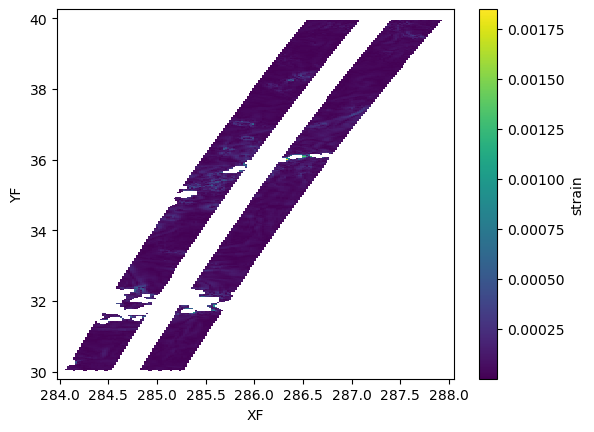

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

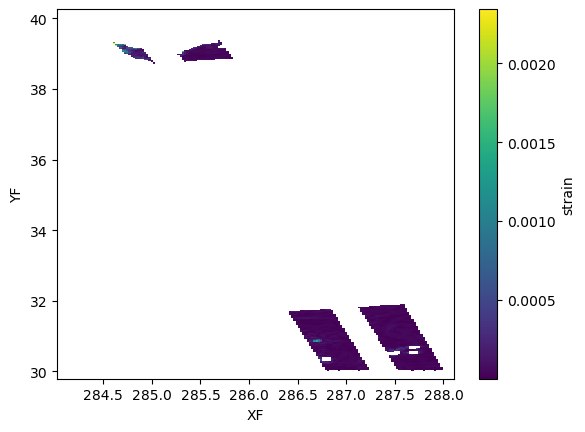

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

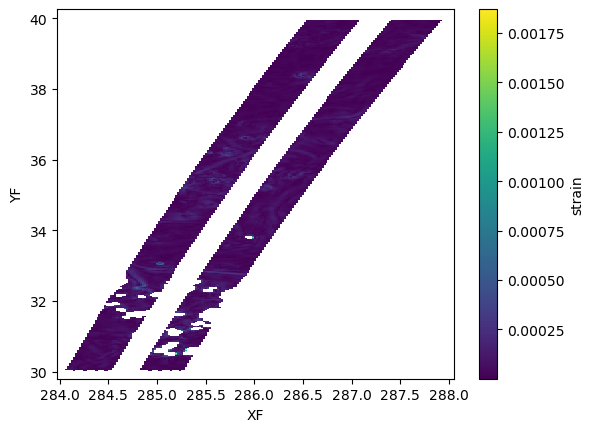

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

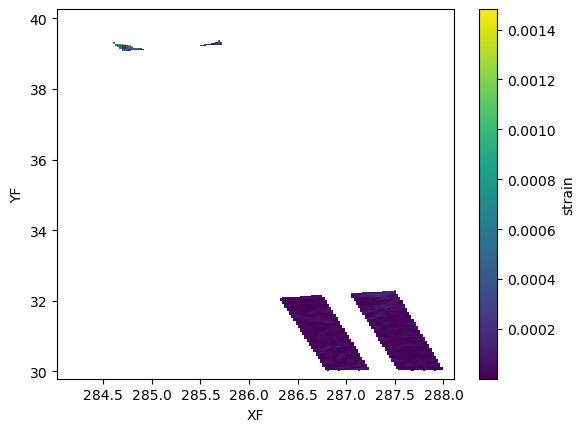

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

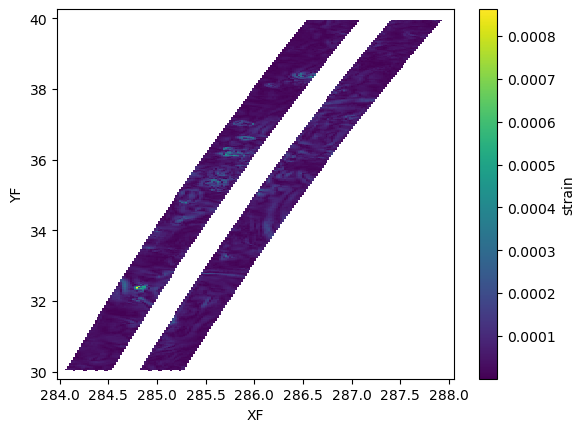

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

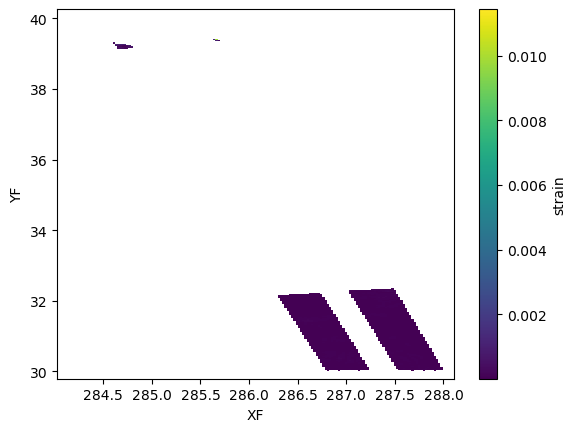

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

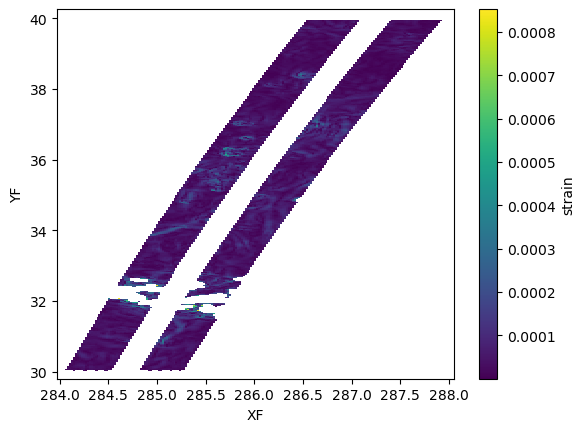

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

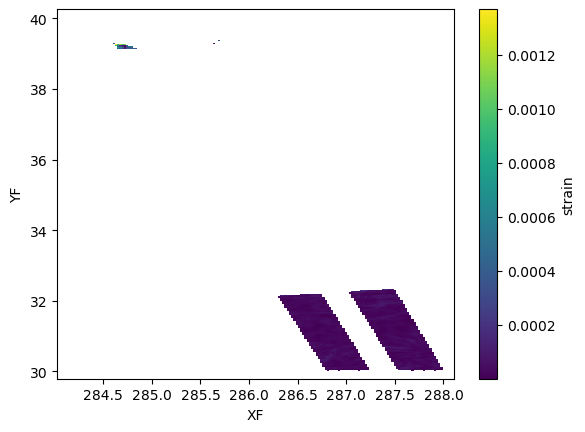

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

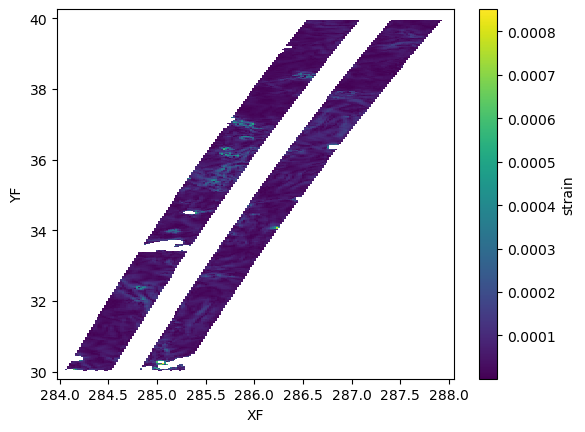

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

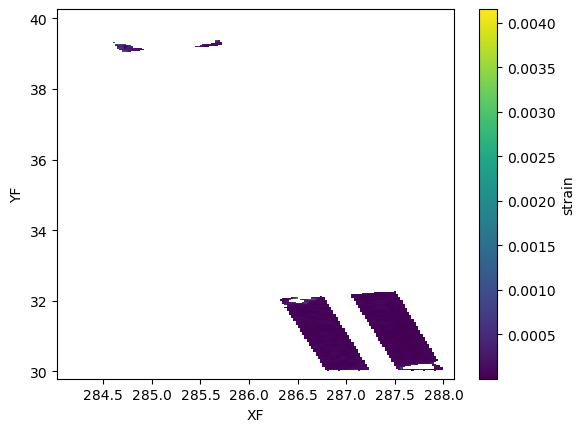

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

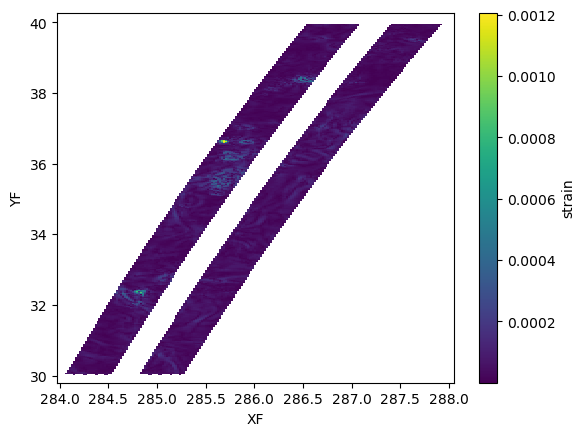

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

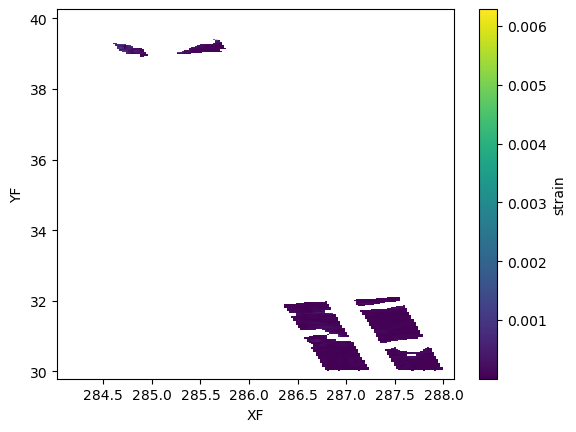

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

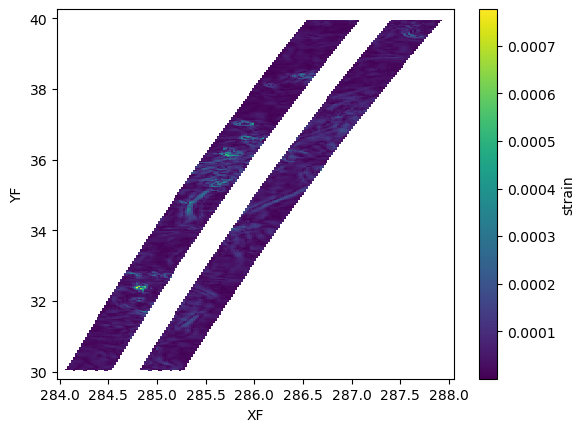

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

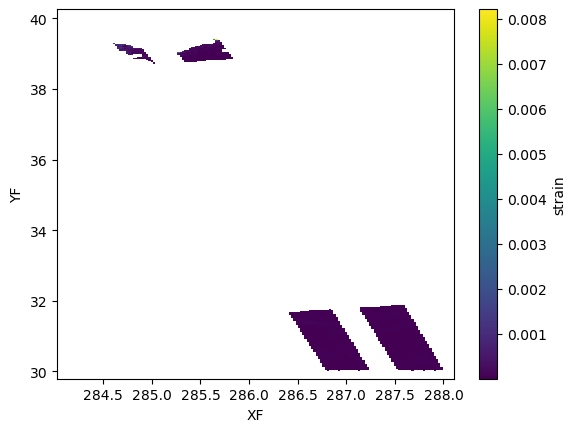

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

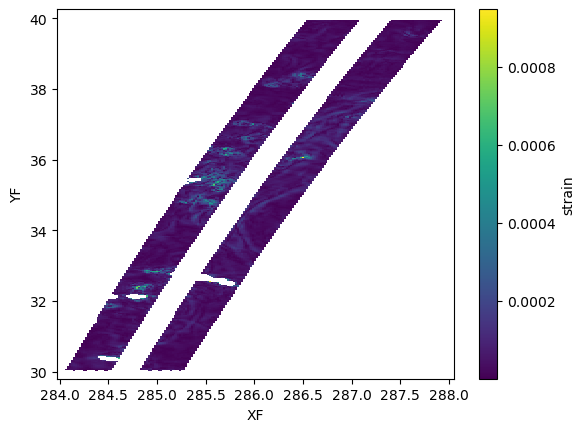

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

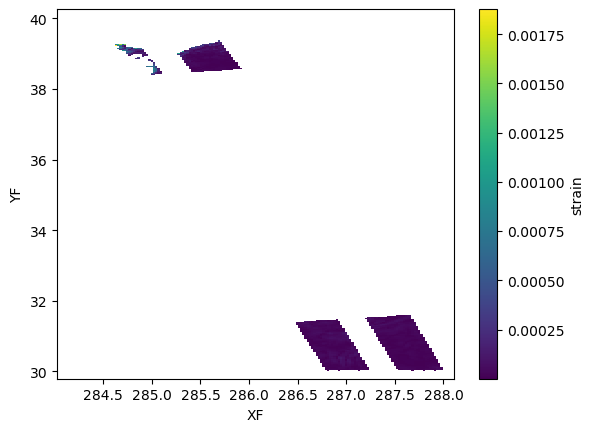

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

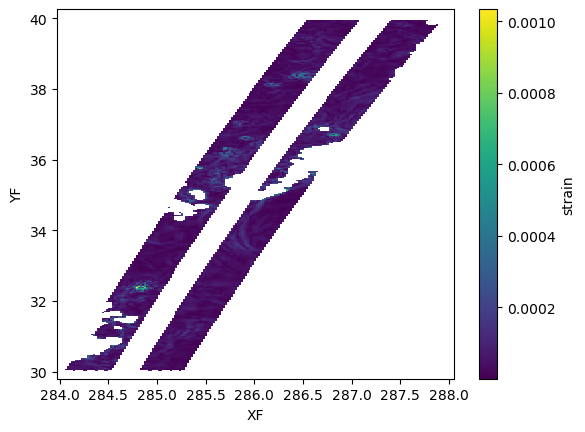

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

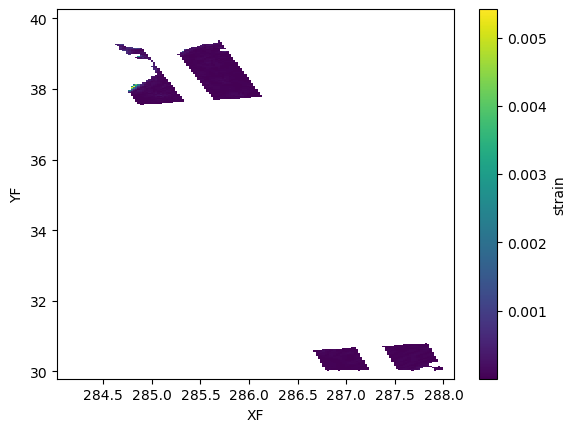

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

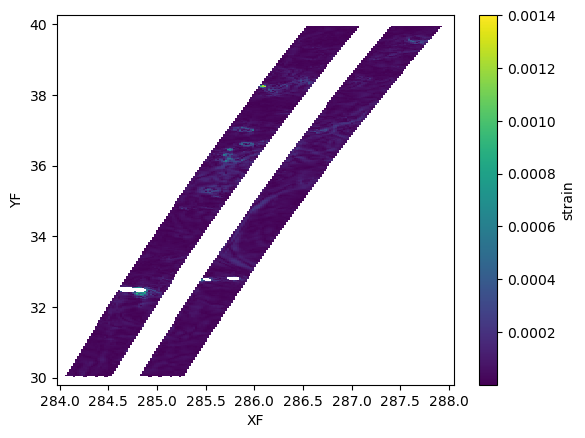

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

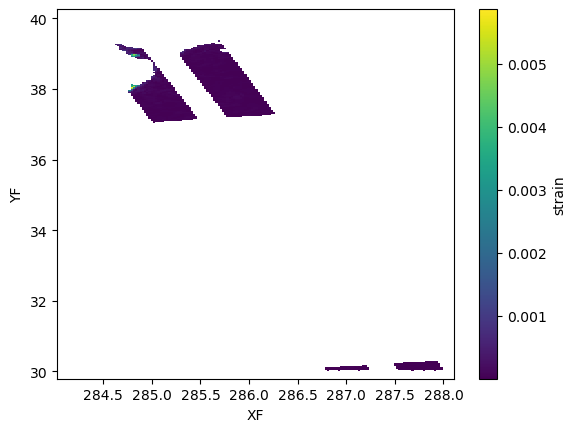

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

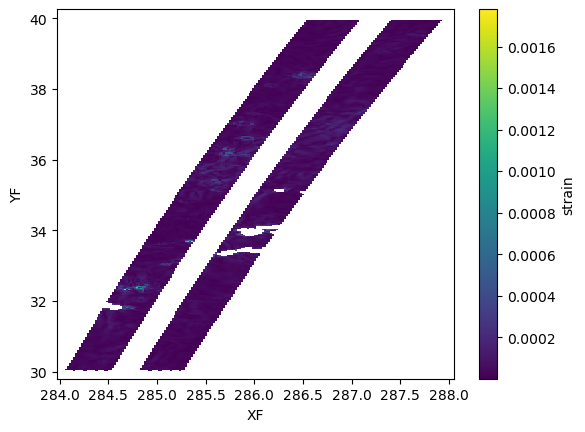

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

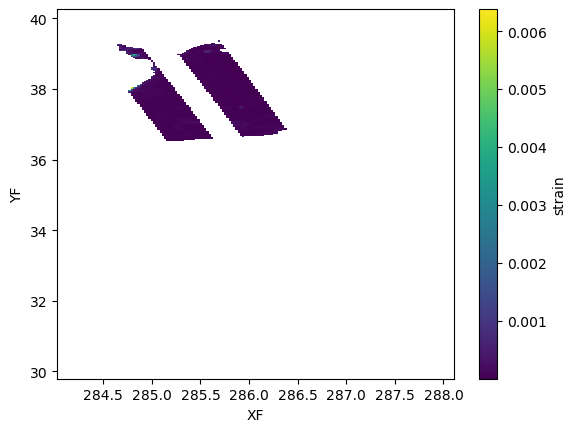

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

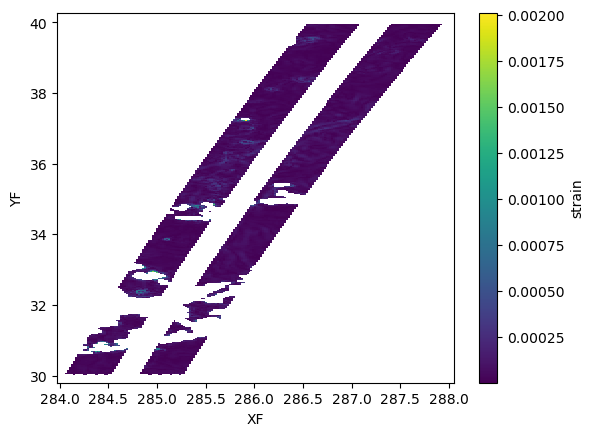

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

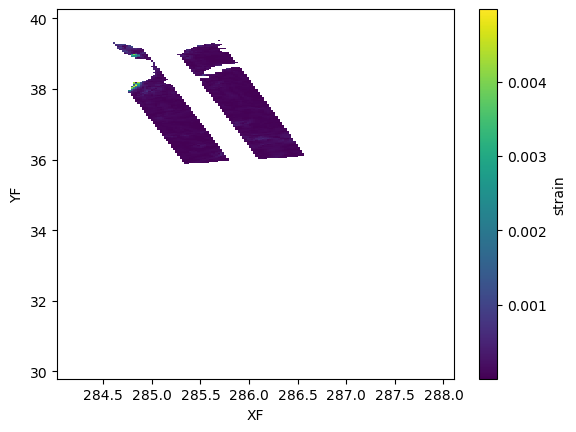

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

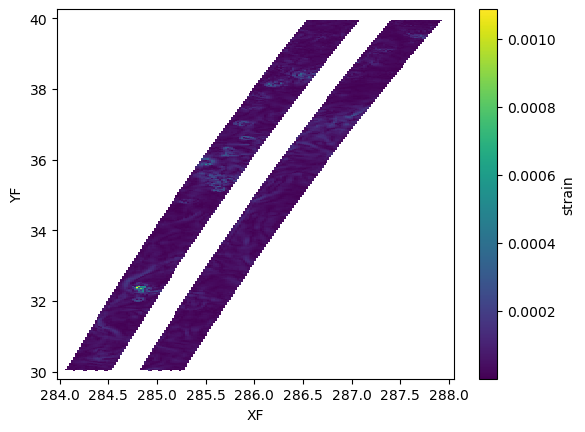

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

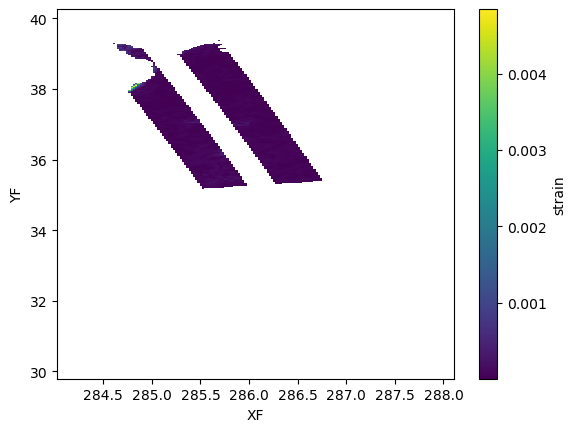

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

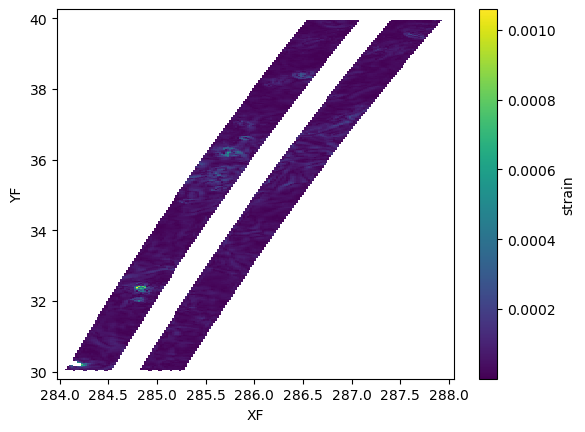

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

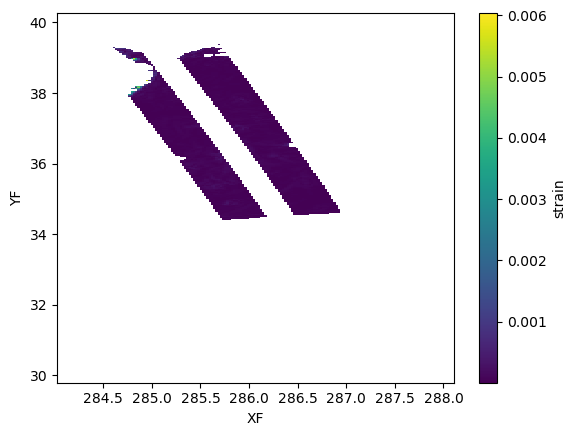

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

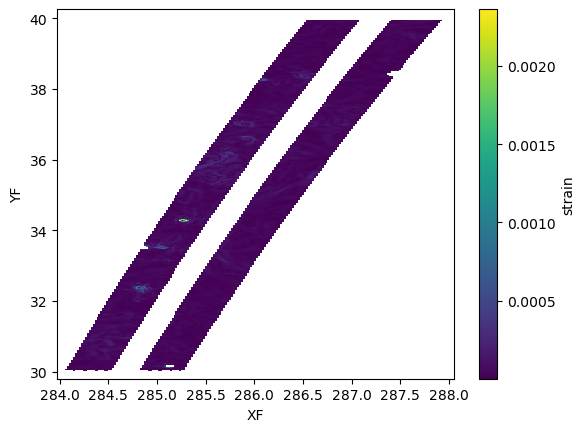

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

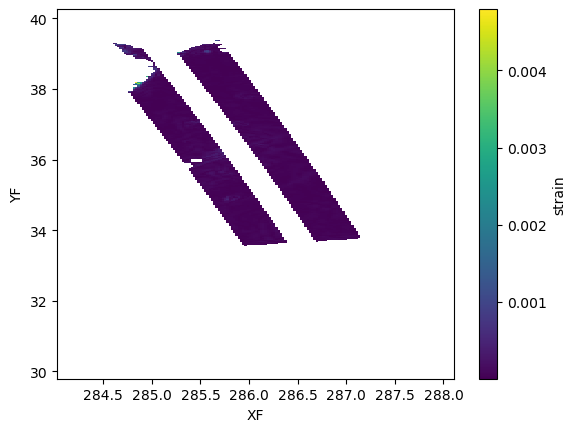

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

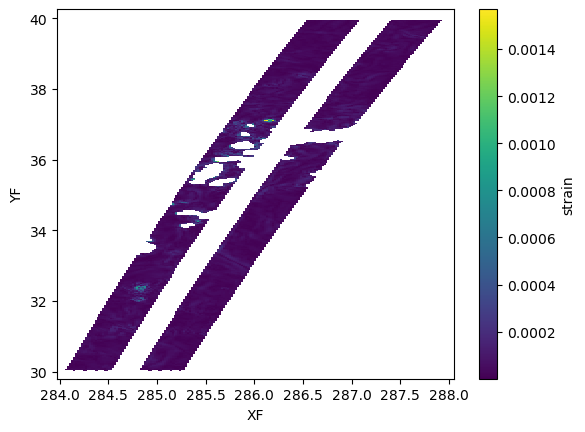

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

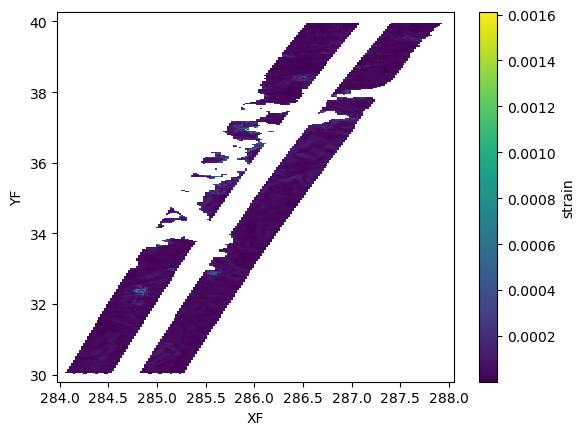

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

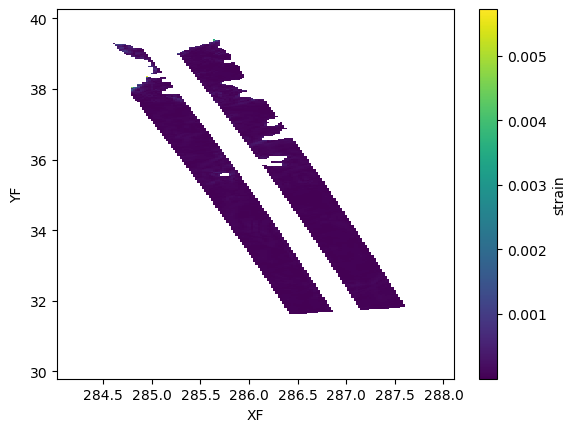

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

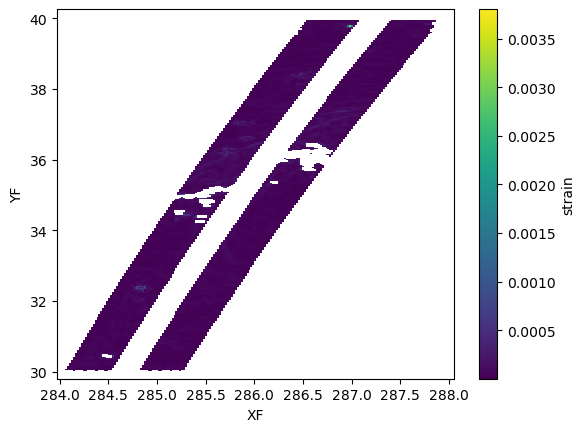

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

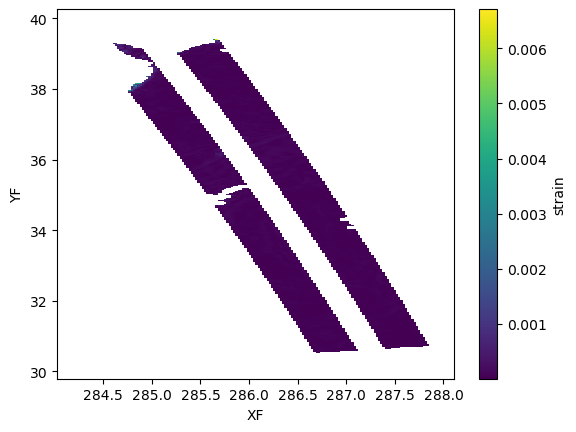

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

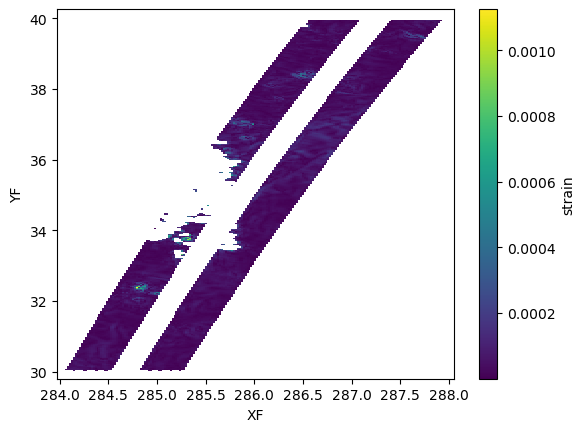

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

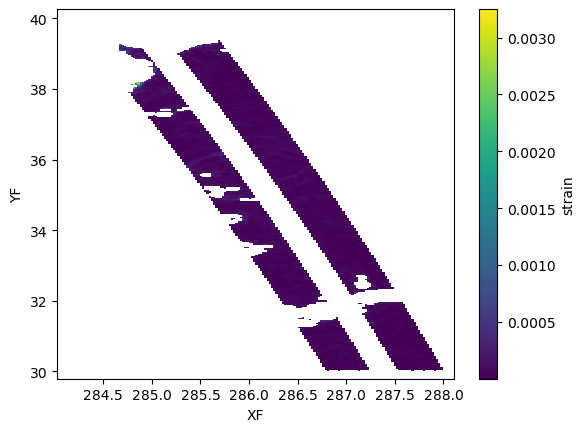

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

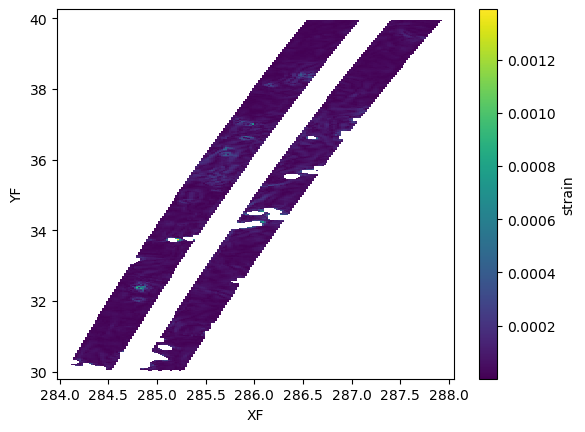

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

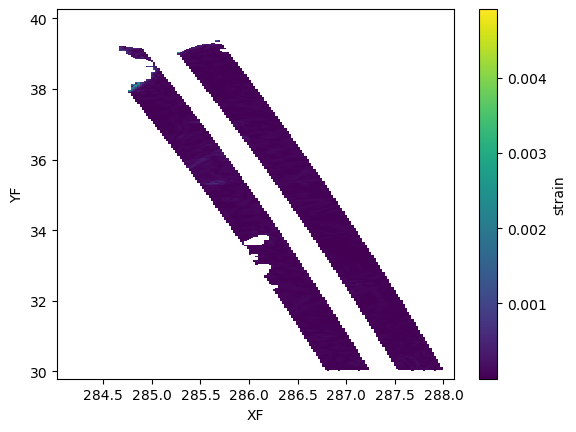

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

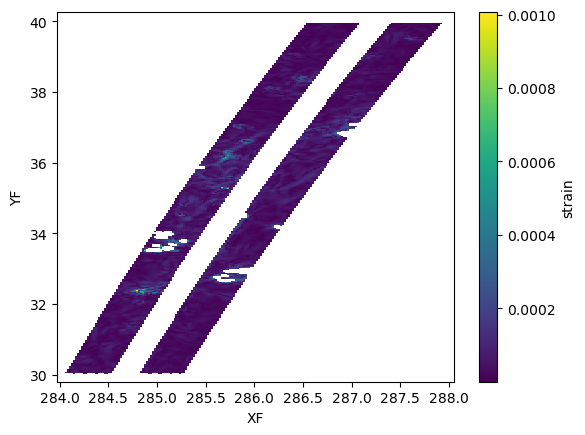

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

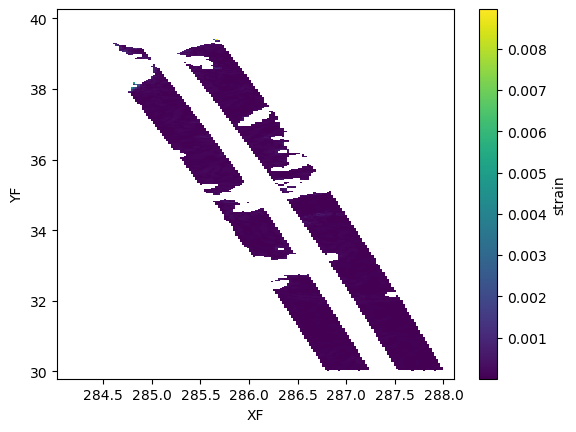

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

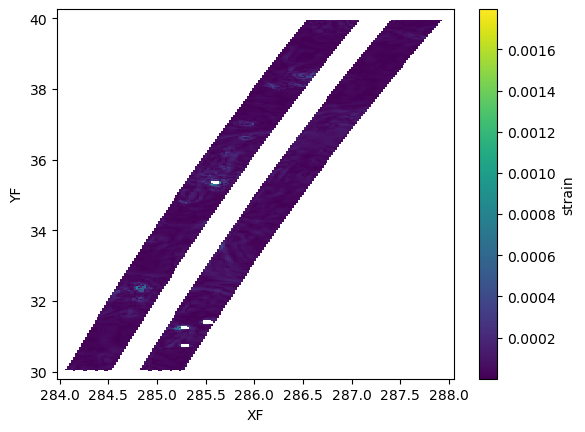

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

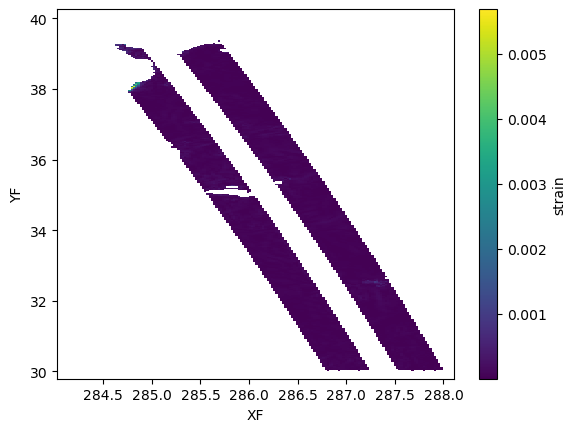

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

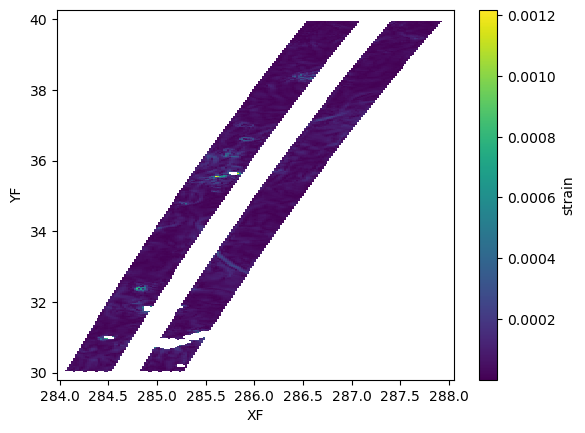

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

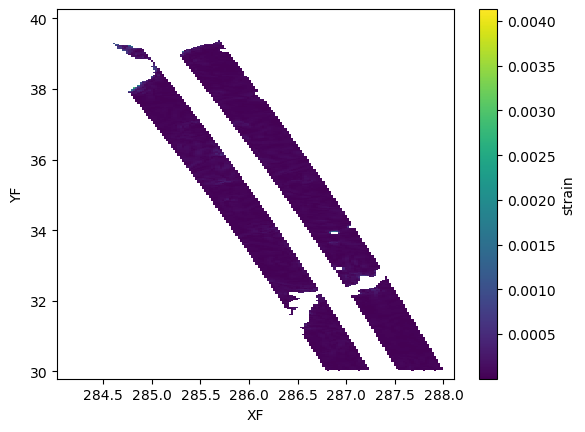

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

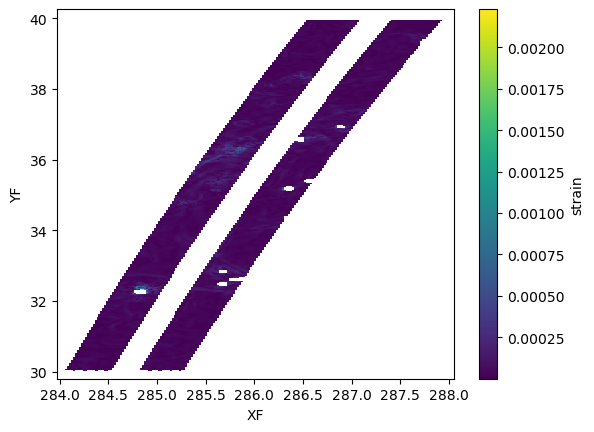

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

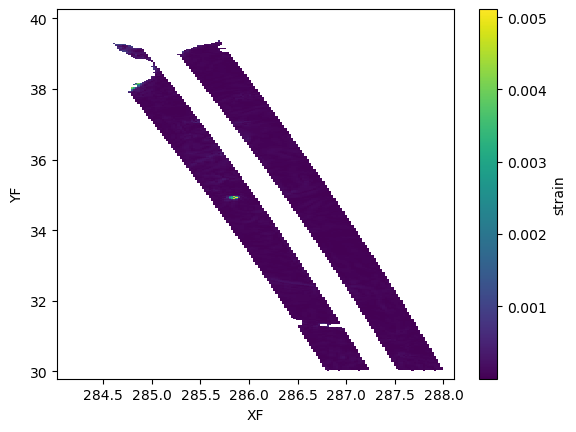

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

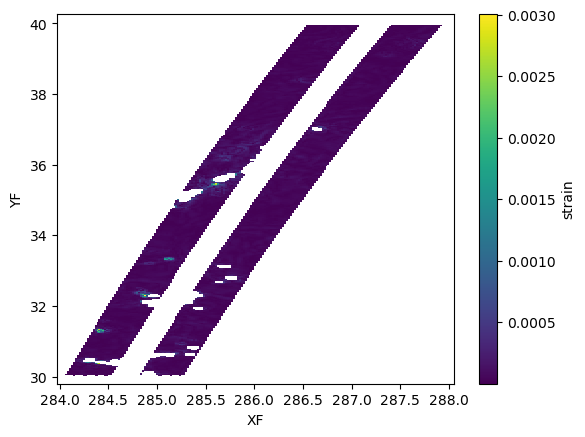

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

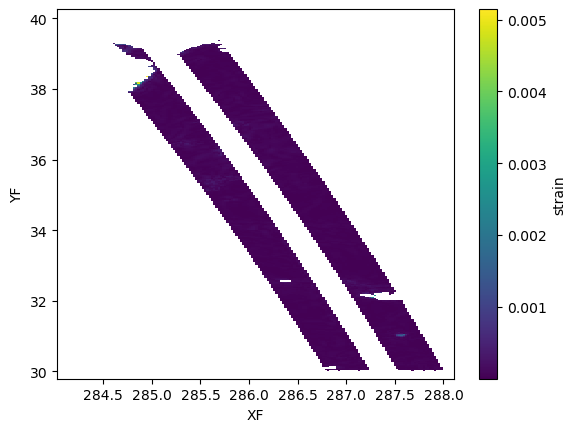

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

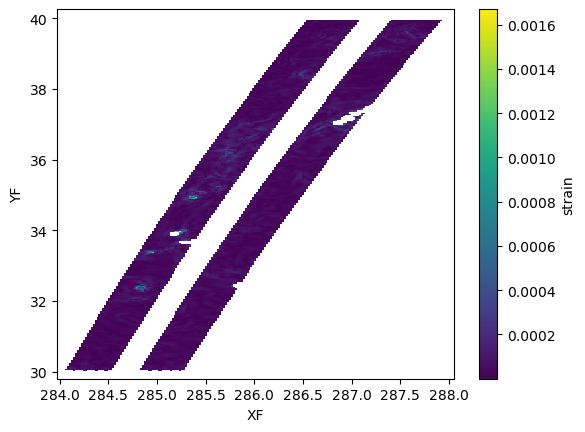

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

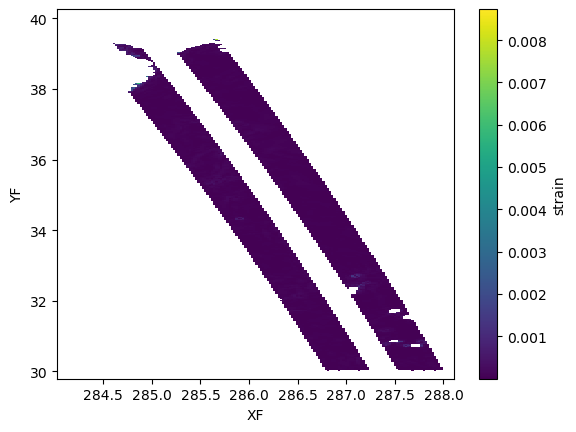

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

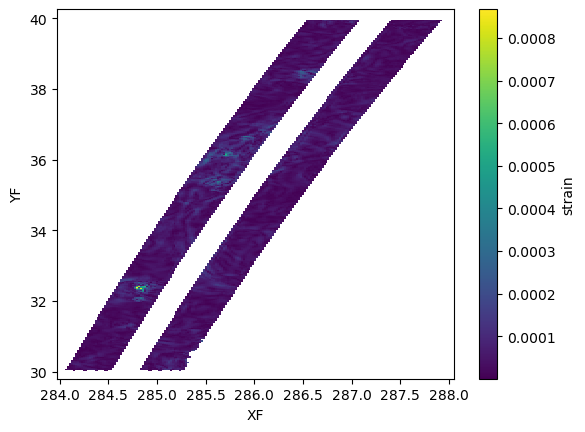

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

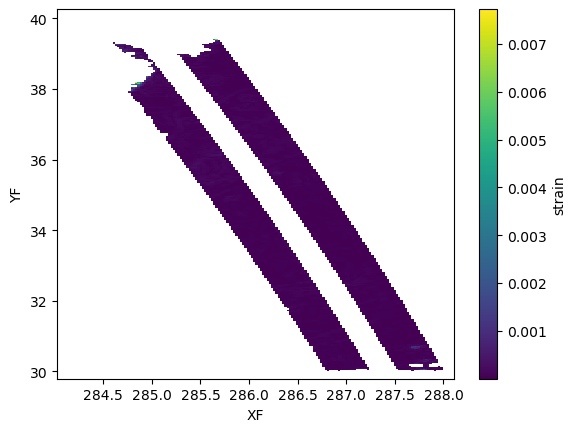

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

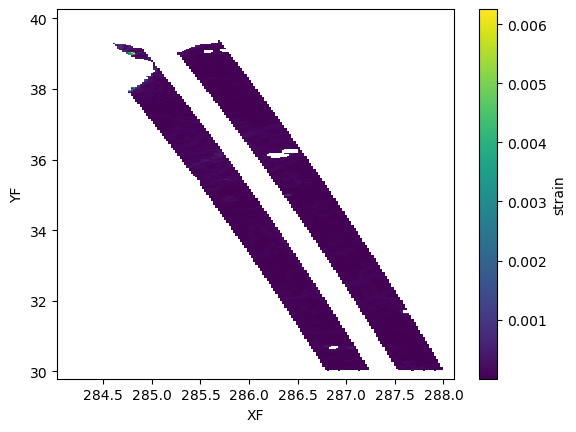

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

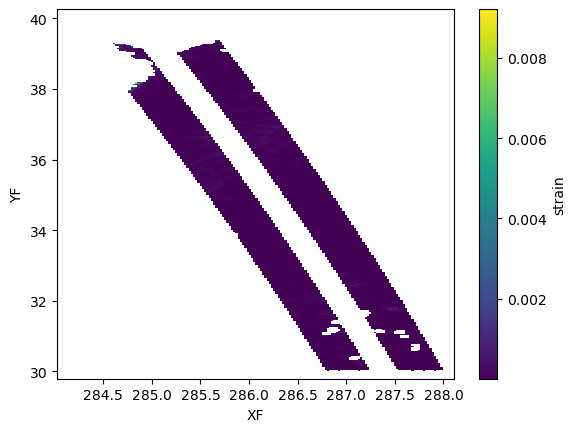

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

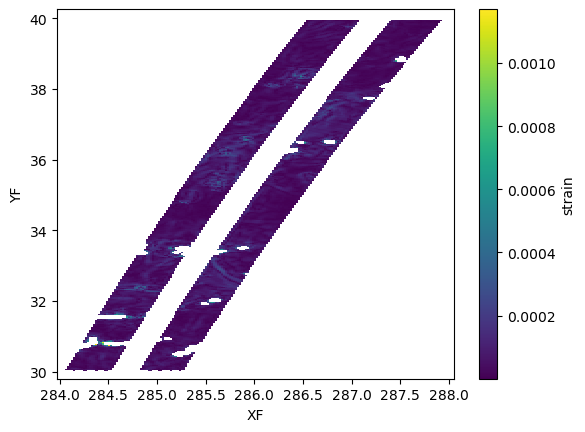

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

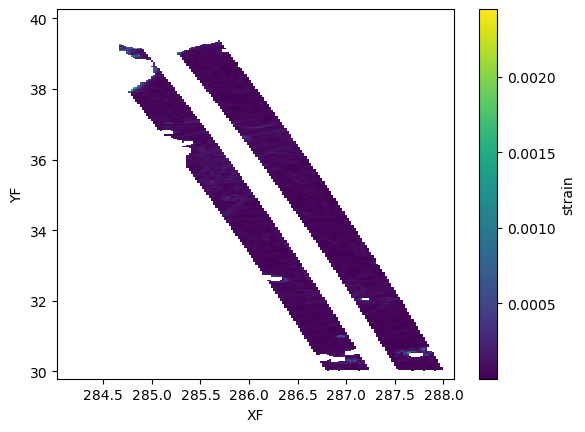

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

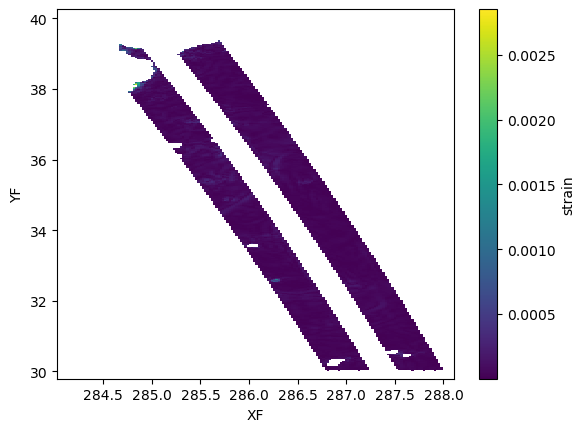

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

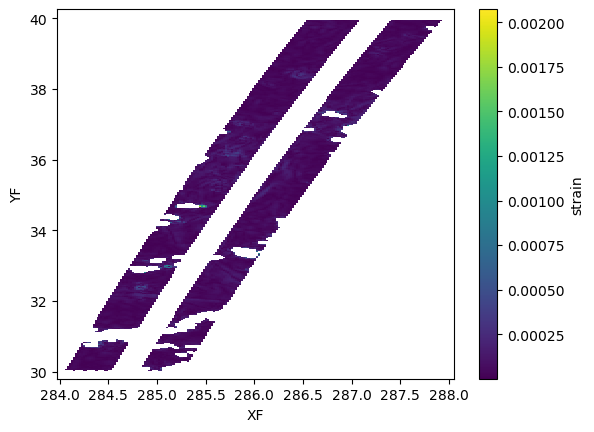

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

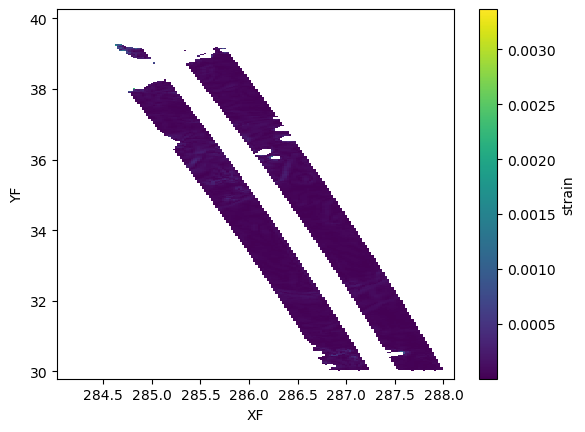

<xarray.Dataset>
Dimensions:  (YF: 590, XF: 178, YG: 591, XC: 180, YC: 592, XG: 179)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.85 29.84 29.82 29.8
  * XF       (XF) float64 288.1 288.1 288.0 288.0 ... 284.1 284.1 284.1 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XG       (XG) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 n

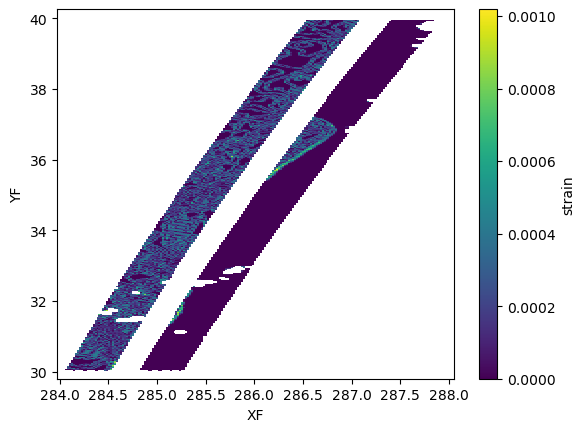

<xarray.Dataset>
Dimensions:  (YF: 599, XF: 201, YG: 600, XC: 203, YC: 601, XG: 202)
Coordinates:
  * YF       (YF) float64 40.26 40.24 40.22 40.2 ... 29.86 29.84 29.82 29.8
  * XF       (XF) float64 288.0 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YG       (YG) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XG       (XG) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    strain   (YF, XF) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    u        (YG, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    v        (YC, XG) float64 na

In [9]:
grav = 9.807

for i in range(len(fnames)):
# for i in range(10):
    dname = op.join(savedir, 
                    'GulfStream/' + fbase + fnames[i]
                   )[:-3] + '.zarr'
    if op.exists(dname):
        print(dname)
        ds = xr.open_zarr(dname)
        
        if ds.longitude[-1,0].values > ds.longitude[0,-1].values:
            yy, xx = np.mgrid[ds.latitude.max(skipna=True).values:ds.latitude.min(skipna=True).values:-np.abs(ds.latitude.diff('num_lines').min(skipna=True).values),
                  ds.longitude.max(skipna=True).values:ds.longitude.min(skipna=True).values:-np.abs(ds.longitude.diff('num_pixels').min(skipna=True).values)
                 ]
        else:
            yy, xx = np.mgrid[ds.latitude.min(skipna=True).values:ds.latitude.max(skipna=True).values:np.abs(ds.latitude.diff('num_lines').min(skipna=True).values),
                  ds.longitude.min(skipna=True).values:ds.longitude.max(skipna=True).values:np.abs(ds.longitude.diff('num_pixels').min(skipna=True).values)
                 ]
        lon = griddata((ds.latitude.values.flatten(),ds.longitude.values.flatten()), 
                       ds.longitude.values.flatten(), 
                       (yy, xx), method='linear'
                      )
        lat = griddata((ds.latitude.values.flatten(),ds.longitude.values.flatten()), 
                       ds.latitude.values.flatten(), 
                       (yy, xx), method='linear'
                      )
        ssh = griddata((ds.latitude.values.flatten(),ds.longitude.values.flatten()), 
                       ds.ssha_noiseless.values.flatten(), 
                       (yy, xx), method='linear'
                      )

        dx = gsw.distance(lon, lat, p=0, axis=-1)
        dy = gsw.distance(lon, lat, p=0, axis=0)

        cori = gsw.f(lat)

        u = -grav*np.diff(ssh,axis=0) / (.5*(cori[1:] + cori[:-1])) / dy
        v = grav*np.diff(ssh,axis=1) / (.5*(cori[:,1:] + cori[:,:-1])) / dx

        u_x = np.diff(u,axis=1) / (.5*(dx[1:] + dx[:-1]))
        v_y = np.diff(v,axis=0) / (.5*(dy[:,1:] + dy[:,:-1]))
        u_x = .25*(u_x[:-1,:-1] + u_x[1:,:-1] + u_x[1:,1:] + u_x[:-1,1:])
        v_y = .25*(v_y[:-1,:-1] + v_y[1:,:-1] + v_y[1:,1:] + v_y[:-1,1:])

        u_y = (np.diff(u,axis=0) / (.5*(dy[1:] + dy[:-1])))[:,1:-1]
        v_x = (np.diff(v,axis=1) / (.5*(dx[:,1:] + dx[:,:-1])))[1:-1]
        
        vort = v_x - u_y

        sn = u_x - v_y
        ss = v_x + u_y
        strain = np.sqrt(sn**2 + ss**2)

        dsave = xr.DataArray(vort, dims=['YF','XF'], 
                             coords={'YF':np.mean(yy[1:-1,1:-1], axis=1),
                                     'XF':np.mean(xx[1:-1,1:-1], axis=0)}
                            ).to_dataset(name='vort')
        dsave['strain'] = xr.DataArray(strain, dims=['YF','XF'], 
                             coords={'YF':np.mean(yy[1:-1,1:-1], axis=1),
                                     'XF':np.mean(xx[1:-1,1:-1], axis=0)}
                            )
        dsave['u'] = xr.DataArray(u, dims=['YG','XC'], 
                             coords={'YG':np.mean(.5*(yy[1:] + yy[:-1]), axis=1),
                                     'XC':np.mean(xx, axis=0)}
                            )
        dsave['v'] = xr.DataArray(v, dims=['YC','XG'], 
                             coords={'YC':np.mean(yy, axis=1),
                                     'XG':np.mean(.5*(xx[:,1:] + xx[:,:-1]), axis=0)}
                            )
        dsave.coords['lon'] = xr.DataArray(lon, dims=['YC','XC'],
                                           coords={'YC':np.mean(yy, axis=1),
                                                   'XC':np.mean(xx, axis=0)})
        dsave.coords['lat'] = xr.DataArray(lat, dims=['YC','XC'],
                                           coords={'YC':np.mean(yy, axis=1),
                                                   'XC':np.mean(xx, axis=0)})
        dsave.strain.plot(vmax=5e-4)
        plt.show()
        print(dsave)
        dsave.chunk({'YC':100,'XC':100,'YG':100,'XG':100,'YF':100,'XF':100}
                   ).to_zarr(op.join(savedir, 
                                     'GulfStream/' + "Geostrophy/" + fnames[i]
                                    )[:-3]
                             + '.zarr', mode='w')
        dsave.close()
        ds.close()

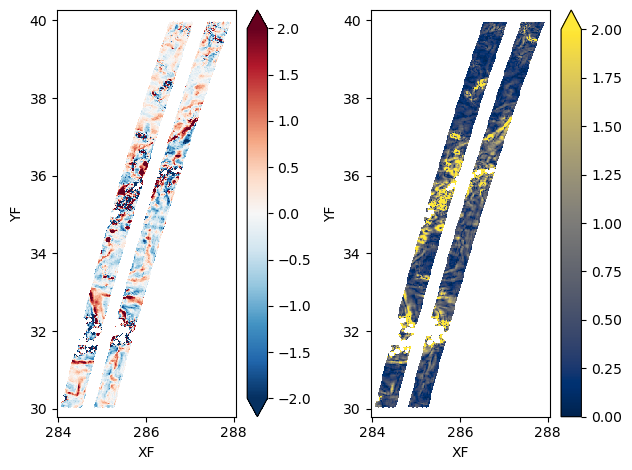

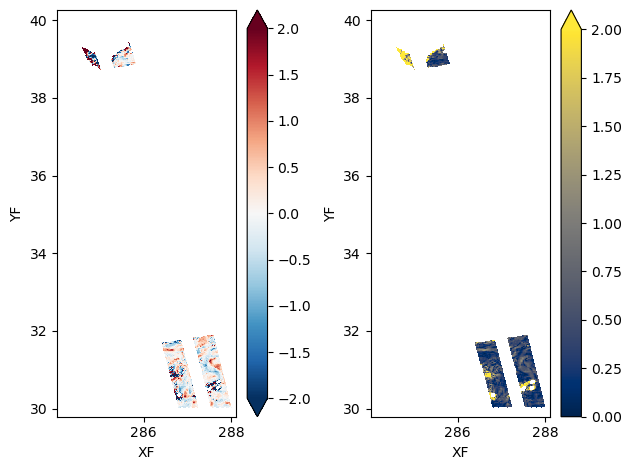

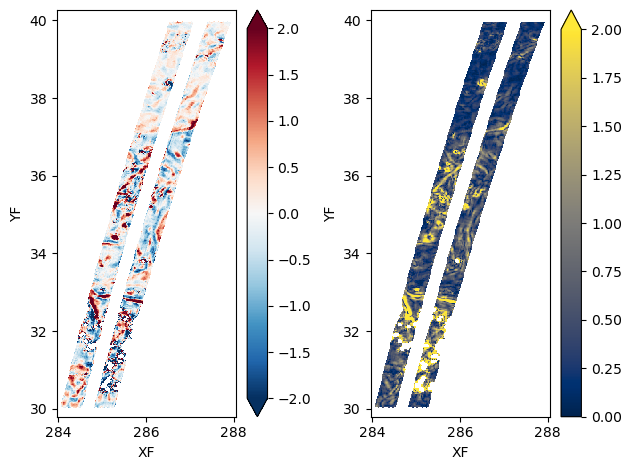

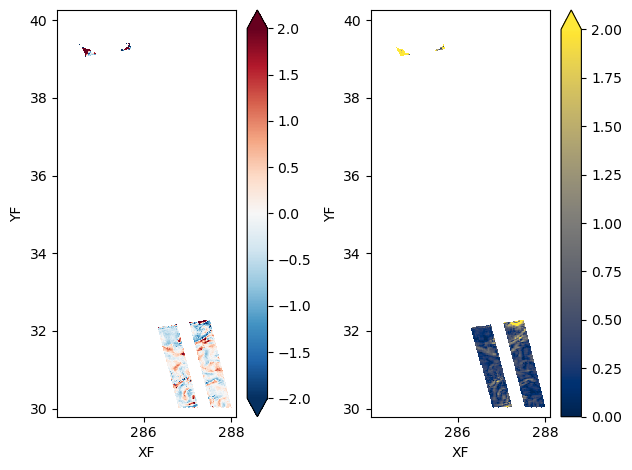

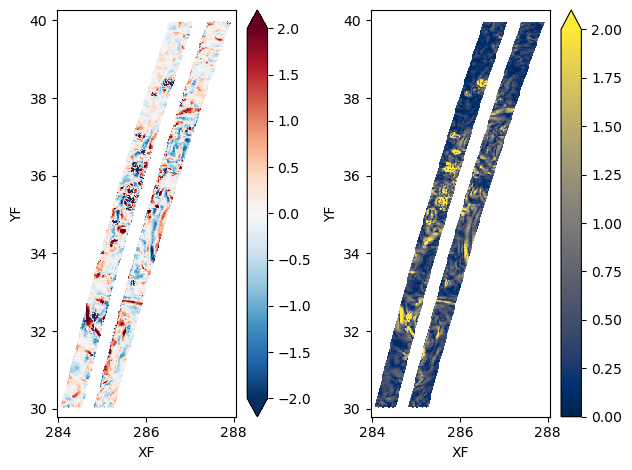

...

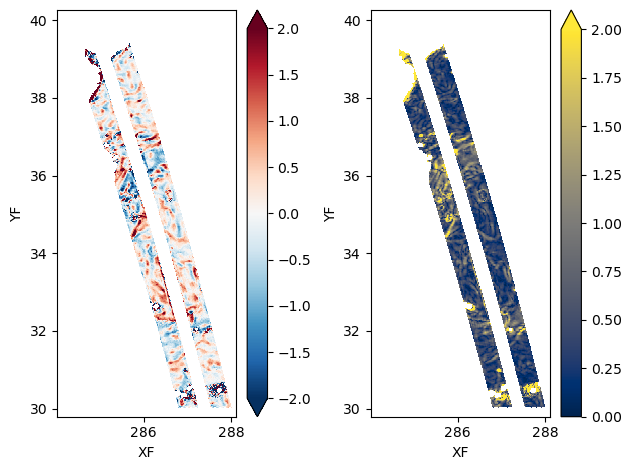

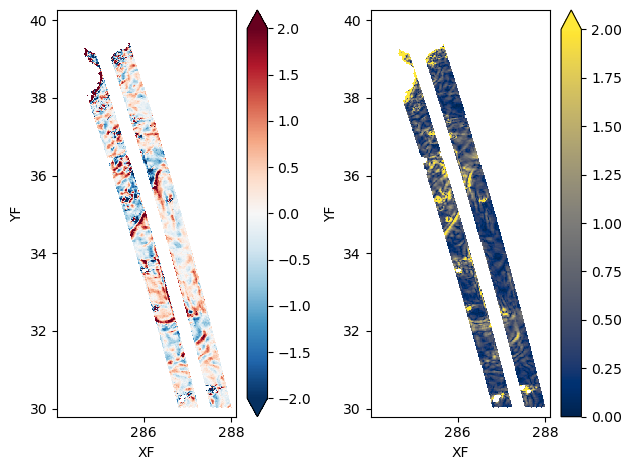

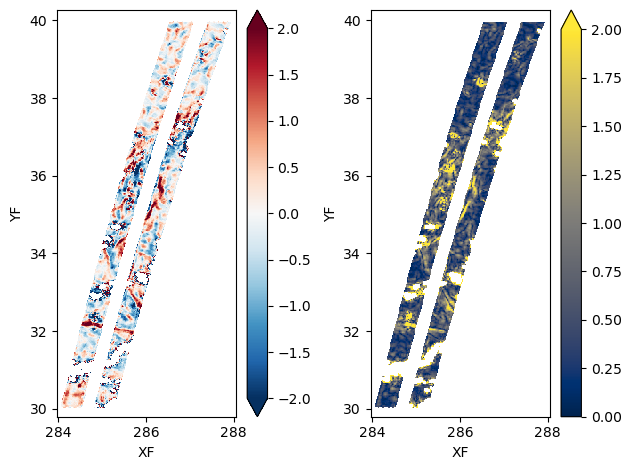

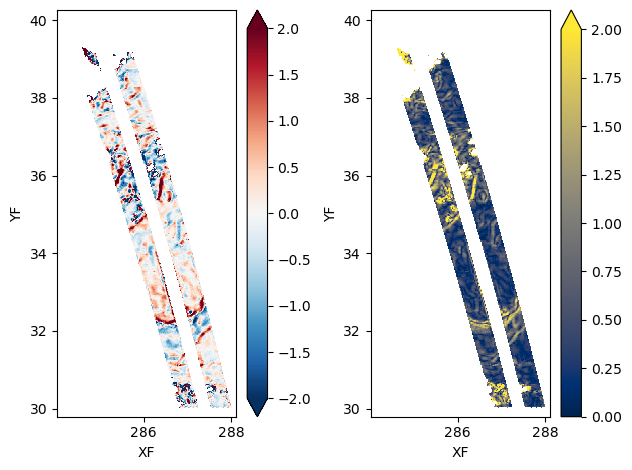

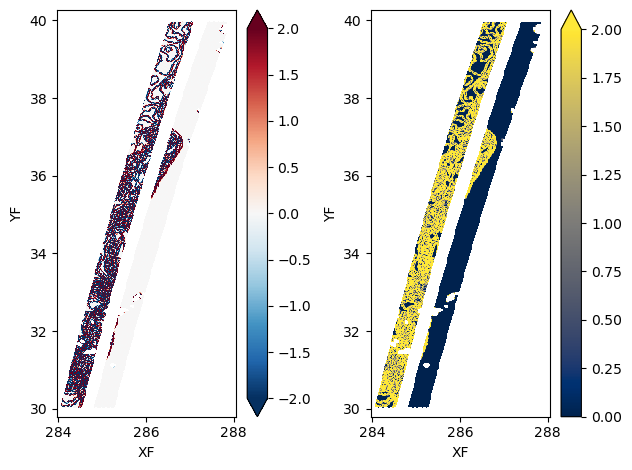

In [36]:
grav = 9.807

for i in range(len(fnames)):
    
    dname = op.join(savedir, 
                    'GulfStream/' + "Geostrophy/" + fnames[i]
                   )[:-3] + '.zarr'
    
    if op.exists(dname):
        ds = xr.open_zarr(dname)
        cori = xr.apply_ufunc(gsw.f, ds.YF, dask='parallelized')
        mask = xr.DataArray(~np.ma.masked_invalid(ds.vort).mask, dims=ds.vort.dims,
                            coords=ds.vort.coords
                           ).stack(Z=("XF", "YF"))
        
        fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2)
        fig.set_tight_layout(True)
        im1 = (ds.vort / cori).plot.pcolormesh(ax=ax1, vmax=2., cmap='RdBu_r', rasterized=True)
        im2 = (ds.strain / cori).plot.pcolormesh(ax=ax2, vmax=2., vmin=0., cmap='cividis', rasterized=True)
        
        plt.show()
        
        ds.close()

In [6]:
grav = 9.807
 
ii = 0
for i in range(len(fnames)):
    
    dname = op.join(savedir, 
                    'GulfStream/' + "Geostrophy/" + fnames[i]
                   )[:-3] + '.zarr'
    
    if op.exists(dname):
        ds = xr.open_zarr(dname)
        cori = xr.apply_ufunc(gsw.f, ds.YF, dask='parallelized')
        mask = xr.DataArray(~np.ma.masked_invalid(ds.vort).mask, dims=ds.vort.dims,
                            coords=ds.vort.coords
                           ).stack(Z=("XF", "YF"))
        if ii == 0:
            zeta = (ds.vort / cori).stack(Z=("XF", "YF")).where(mask, drop=True)
            alpha = (ds.strain / cori).stack(Z=("XF", "YF")).where(mask, drop=True)
            print(zeta,alpha)
        else:
            zeta = xr.concat([zeta, (ds.vort / cori
                                    ).stack(Z=("XF", "YF")).where(mask, drop=True)
                             ], 'Z')
            alpha = xr.concat([alpha, (ds.strain / cori
                                      ).stack(Z=("XF", "YF")).where(mask, drop=True)
                              ], 'Z')
        
        ds.close()

        ii += 1

<xarray.DataArray (Z: 27123)>
dask.array<where, shape=(27123,), dtype=float64, chunksize=(4393,), chunktype=numpy.ndarray>
Coordinates:
  * Z        (Z) object MultiIndex
  * XF       (Z) float64 287.9 287.9 287.9 287.9 ... 284.1 284.1 284.1 284.1
  * YF       (Z) float64 39.96 39.94 39.92 39.96 ... 30.05 30.07 30.05 30.03 <xarray.DataArray (Z: 27123)>
dask.array<where, shape=(27123,), dtype=float64, chunksize=(4393,), chunktype=numpy.ndarray>
Coordinates:
  * Z        (Z) object MultiIndex
  * XF       (Z) float64 287.9 287.9 287.9 287.9 ... 284.1 284.1 284.1 284.1
  * YF       (Z) float64 39.96 39.94 39.92 39.96 ... 30.05 30.07 30.05 30.03


In [8]:
vbins = np.linspace(-4e0,4e0,40)
sbins = np.linspace(0,4e0,20)

In [8]:
histswot = xhist(alpha.rename('strain').chunk({'Z':-1}), 
                 zeta.rename('vort').chunk({'Z':-1}), 
                 bins=[sbins, vbins], density=True
                ).compute()
histswot

<xarray.DataArray 'histogram_strain_vort' (strain_bin: 19, vort_bin: 39)>
array([[1.54012173e-04, 1.15509130e-04, 1.54012173e-04, 2.50269781e-04,
        2.31018259e-04, 3.65778911e-04, 4.42784997e-04, 5.19791084e-04,
        8.27815430e-04, 1.38610956e-03, 1.92515216e-03, 3.54227998e-03,
        6.89204474e-03, 1.46696595e-02, 3.08986922e-02, 7.20391939e-02,
        1.81060561e-01, 4.23937758e-01, 8.34322444e-01, 1.32385014e+00,
        7.61166662e-01, 3.94502181e-01, 1.77730048e-01, 7.51579404e-02,
        3.58655848e-02, 1.61520266e-02, 8.06638756e-03, 3.60003454e-03,
        2.48344629e-03, 1.59787629e-03, 9.62576081e-04, 5.00539562e-04,
        5.77545649e-04, 3.27275868e-04, 1.34760651e-04, 2.31018259e-04,
        2.69521303e-04, 1.73263695e-04, 1.54012173e-04],
       [1.34760651e-04, 1.92515216e-04, 4.42784997e-04, 4.81288041e-04,
        5.00539562e-04, 7.50809343e-04, 1.28985195e-03, 1.52087021e-03,
        2.21392499e-03, 3.69629215e-03, 5.92946866e-03, 1.04343247e-02,
        1.95017914e-02, 3.88688222e-02, 8.10296545e-02, 1.89511979e-01,
        4.08036001e-01, 7.78801056e-01, 1.19257401e+00, 1.34602789e+00,
        1.12890923e+00, 7.17600469e-01, 3.80795098e-01, 1.86604999e-01,
        8.85955025e-02, 4.36239480e-02, 2.22547590e-02, 1.20707041e-02,
        7.00755387e-03, 4.06207106e-03, 2.94548281e-03, 1.86739760e-03,
        1.05883369e-03, 1.15509130e-03, 1.02033065e-03, 7.89312387e-04,
        5.58294127e-04, 2.11766738e-04, 3.27275868e-04],
...
       [5.00539562e-04, 7.50809343e-04, 1.05883369e-03, 4.62036519e-04,
        6.54551735e-04, 6.93054778e-04, 6.93054778e-04, 7.31557822e-04,
        8.27815430e-04, 4.62036519e-04, 7.89312387e-04, 7.12306300e-04,
        5.19791084e-04, 5.39042605e-04, 6.35300214e-04, 5.58294127e-04,
        5.19791084e-04, 6.73803257e-04, 4.81288041e-04, 5.96797170e-04,
        5.96797170e-04, 5.00539562e-04, 4.62036519e-04, 5.39042605e-04,
        5.77545649e-04, 5.77545649e-04, 4.81288041e-04, 4.23533476e-04,
        5.77545649e-04, 5.58294127e-04, 4.62036519e-04, 6.16048692e-04,
        4.42784997e-04, 5.96797170e-04, 6.54551735e-04, 7.89312387e-04,
        9.81827603e-04, 9.43324560e-04, 6.54551735e-04],
       [7.70060865e-04, 7.31557822e-04, 5.19791084e-04, 4.62036519e-04,
        6.16048692e-04, 5.00539562e-04, 6.54551735e-04, 4.04281954e-04,
        5.58294127e-04, 5.96797170e-04, 4.81288041e-04, 4.04281954e-04,
        6.35300214e-04, 5.77545649e-04, 5.00539562e-04, 5.19791084e-04,
        4.62036519e-04, 5.58294127e-04, 3.85030432e-04, 4.81288041e-04,
        5.39042605e-04, 3.08024346e-04, 4.23533476e-04, 3.27275868e-04,
        3.08024346e-04, 4.81288041e-04, 4.04281954e-04, 5.58294127e-04,
        3.27275868e-04, 4.04281954e-04, 4.42784997e-04, 2.50269781e-04,
        4.62036519e-04, 4.81288041e-04, 2.88772824e-04, 4.23533476e-04,
        4.81288041e-04, 9.43324560e-04, 7.89312387e-04]])
Coordinates:
  * strain_bin  (strain_bin) float64 0.1053 0.3158 0.5263 ... 3.474 3.684 3.895
  * vort_bin    (vort_bin) float64 -3.897 -3.692 -3.487 ... 3.487 3.692 3.897

/tmp/ipykernel_233136/2617929998.py:15: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in im.collections:


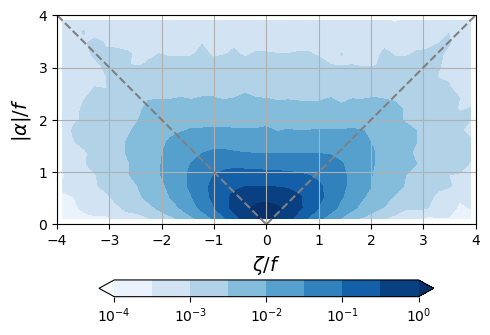

In [9]:
from matplotlib import ticker
import matplotlib.colors as clr

fig, ax = plt.subplots(figsize=(5,4))
fig.set_tight_layout(True)

im = ax.contourf(histswot.vort_bin,
                 histswot.strain_bin,
                 histswot, 
                 cmap='Blues', locator=ticker.LogLocator(), 
                 norm=clr.LogNorm(), levels=np.logspace(-4,0,9),
                 extend='both'
#                       rasterized=True
               )
for c in im.collections:
    c.set_rasterized(True)

ax.plot(np.linspace(0,4,5),np.linspace(0,4,5),c='grey',ls='--')
ax.plot(np.linspace(-4,0,5),np.linspace(4,0,5),c='grey',ls='--')

ax.set_xlim([-4,4])
ax.set_ylim([0,4])

ax.set_xlabel(r"$\zeta/f$", fontsize=14)
ax.set_ylabel(r"$|\alpha|/f$", fontsize=14)

ax.grid(True)
ax.set_aspect('equal')

cbar = fig.colorbar(im, orientation='horizontal', ax=ax, shrink=.8, ticks=[1e-4,1e-3,1e-2,1e-1,1e0])

plt.savefig(op.join(savedir,'Figs/vort-strain-jointPDF.pdf'))

/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_541_009_20230603T182306_20230603T191411_v0.1.zarr
<xarray.DataArray (YC: 601, XC: 203)>
dask.array<sub, shape=(601, 203), dtype=float64, chunksize=(601, 203), chunktype=numpy.ndarray>
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0 <xarray.DataArray (YC: 601, XC: 203)>
dask.array<sqrt, shape=(601, 203), dtype=float64, chunksize=(601, 203), chunktype=numpy.ndarray>
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0


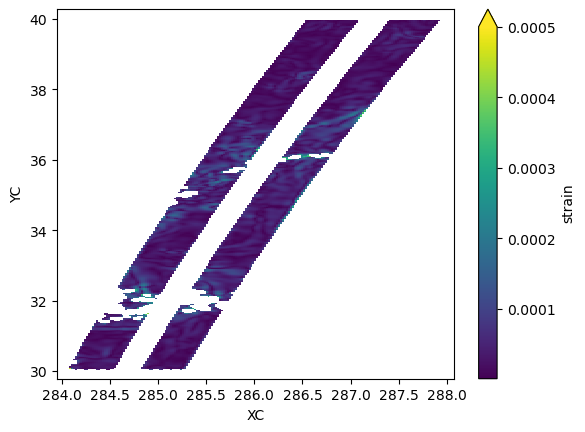

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_541_022_20230604T052720_20230604T061825_v0.1.zarr
<xarray.DataArr

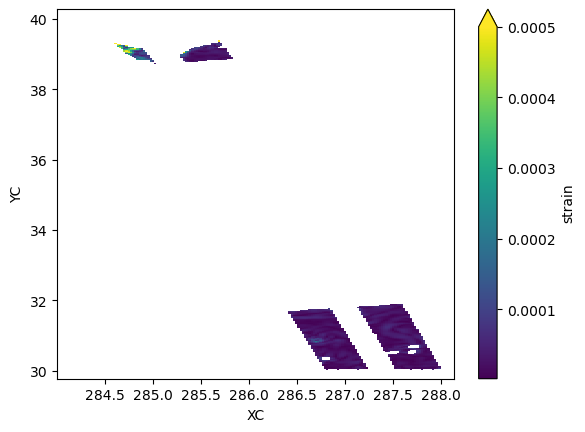

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_542_009_20230604T181344_20230604T190449_v0.1.zarr
<xarray.DataAr

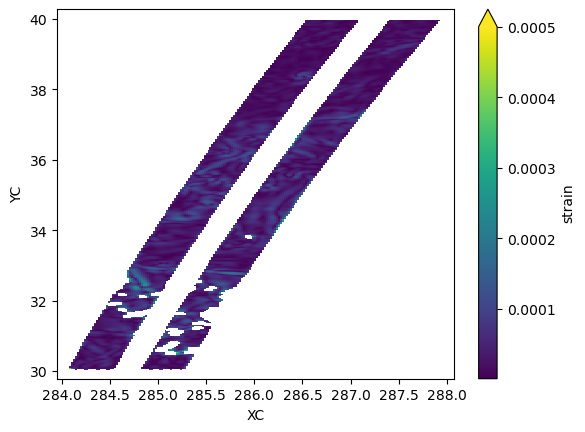

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_543_022_20230606T050835_20230606T055941_v0.1.zarr
<xarray.DataArr

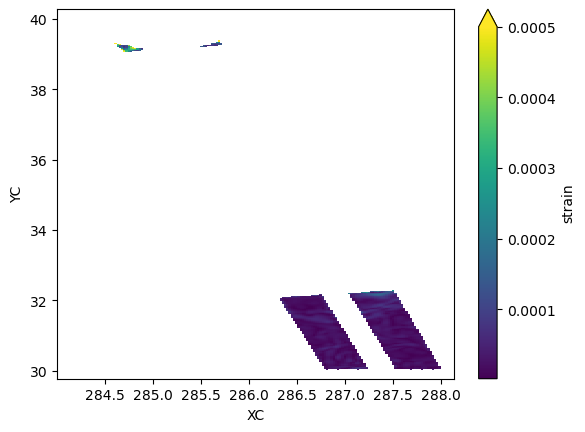

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_544_009_20230606T175500_20230606T184605_v0.1.zarr
<xarray.DataAr

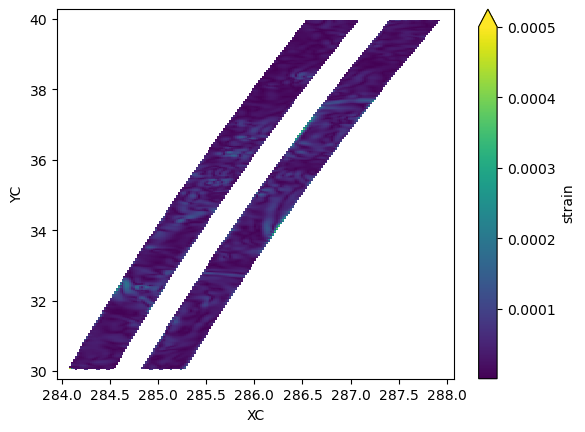

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_544_022_20230607T045913_20230607T055019_v0.1.zarr
<xarray.DataArr

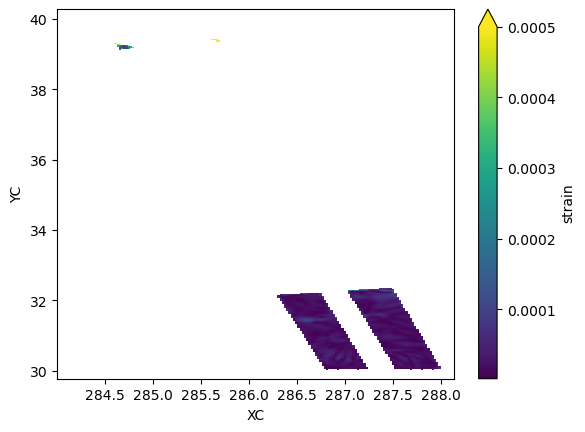

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_545_009_20230607T174538_20230607T183643_v0.1.zarr
<xarray.DataAr

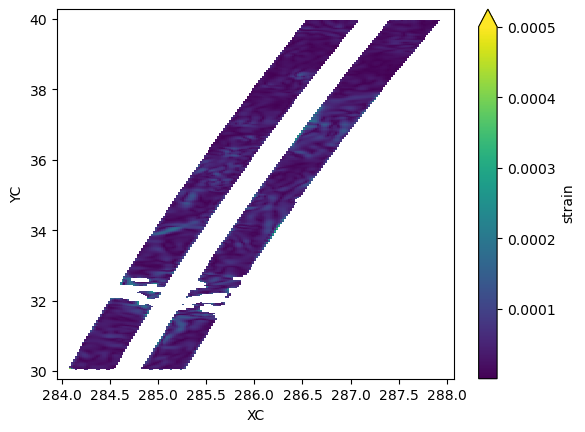

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_545_022_20230608T044951_20230608T054057_v0.1.zarr
<xarray.DataArr

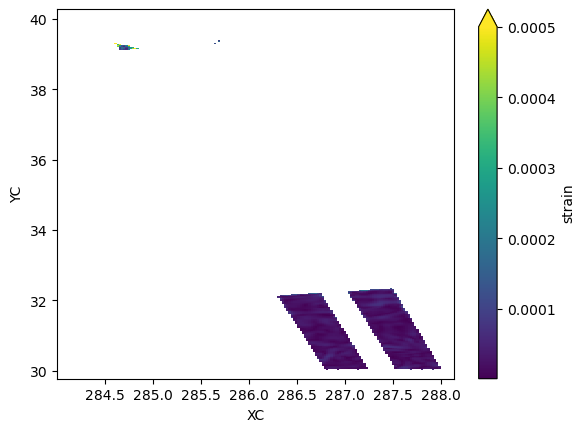

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_546_009_20230608T173615_20230608T182721_v0.1.zarr
<xarray.DataAr

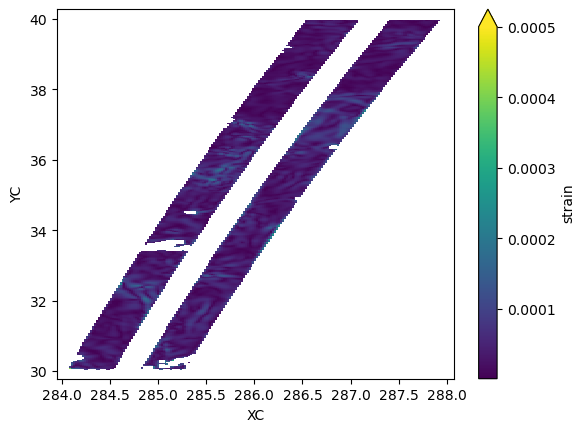

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_546_022_20230609T044029_20230609T053134_v0.1.zarr
<xarray.DataArr

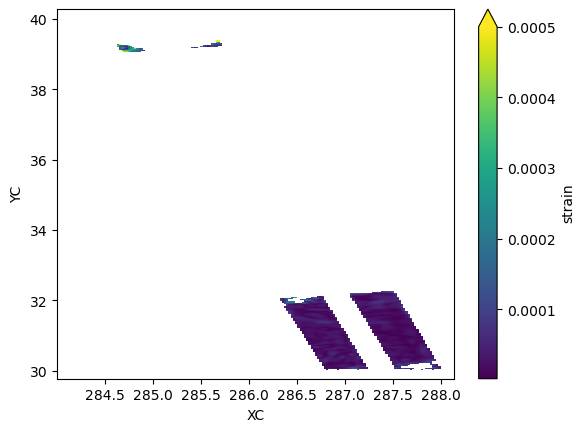

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_547_009_20230609T172653_20230609T181758_v0.1.zarr
<xarray.DataAr

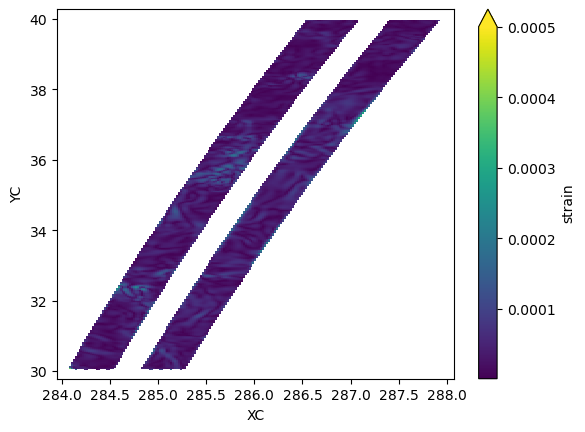

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_547_022_20230610T043107_20230610T052212_v0.1.zarr
<xarray.DataArr

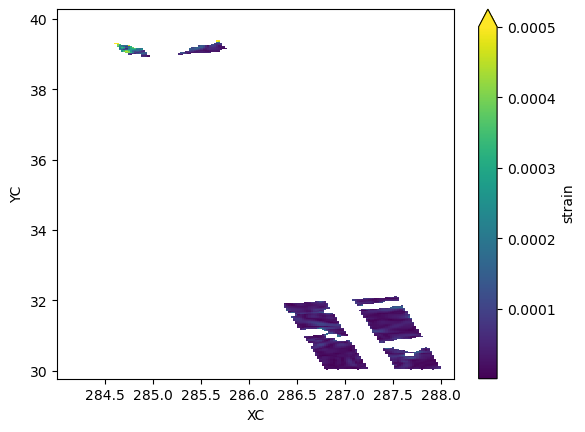

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_548_009_20230610T171731_20230610T180836_v0.1.zarr
<xarray.DataAr

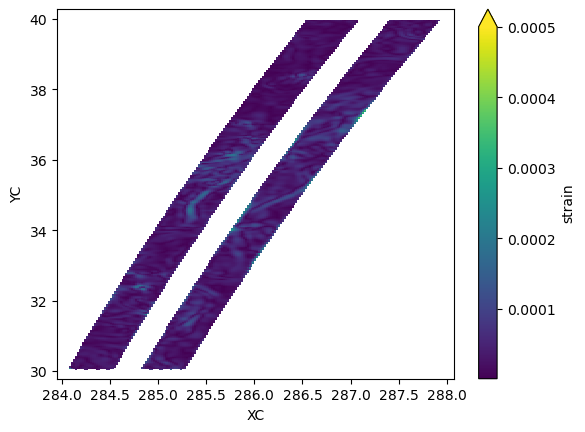

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_548_022_20230611T042144_20230611T051250_v0.1.zarr
<xarray.DataArr

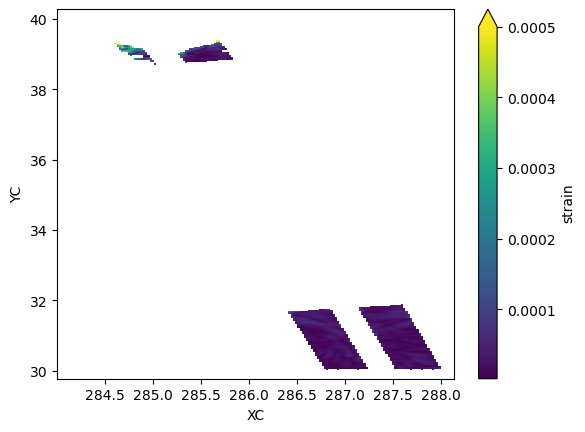

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_549_009_20230611T170809_20230611T175914_v0.1.zarr
<xarray.DataAr

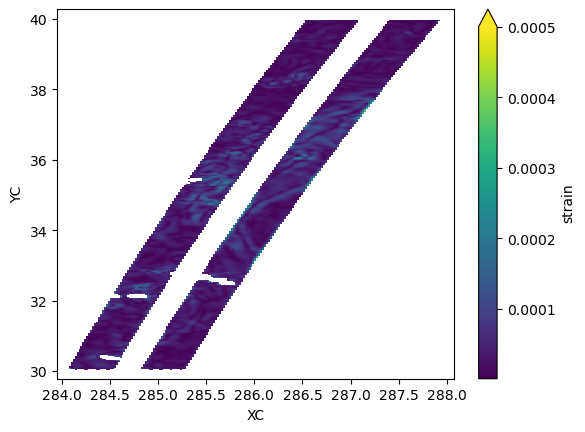

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_549_022_20230612T041222_20230612T050328_v0.1.zarr
<xarray.DataArr

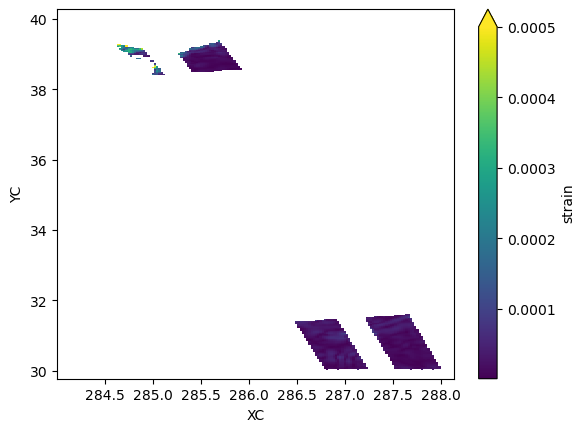

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_550_009_20230612T165846_20230612T174952_v0.1.zarr
<xarray.DataAr

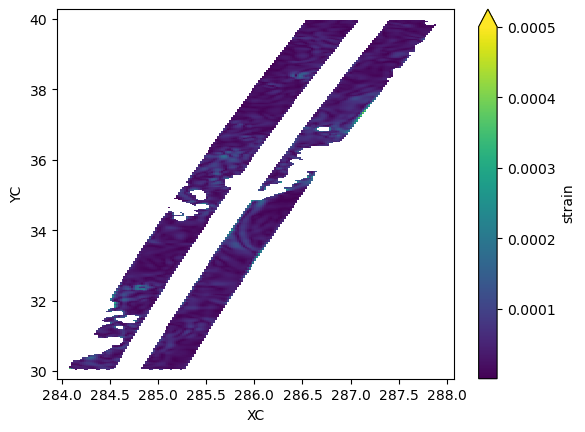

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_551_022_20230614T035337_20230614T044443_v0.1.zarr
<xarray.DataArr

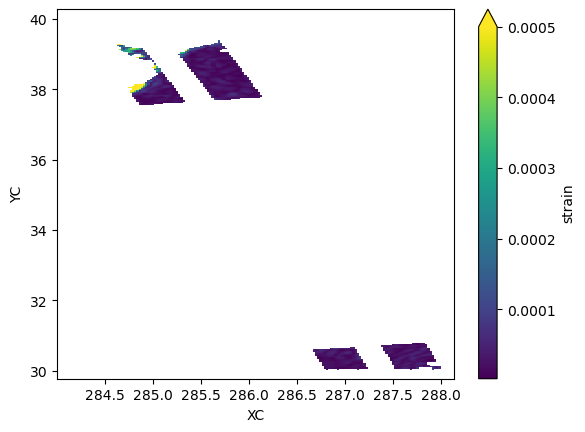

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_552_009_20230614T164002_20230614T173107_v0.1.zarr
<xarray.DataAr

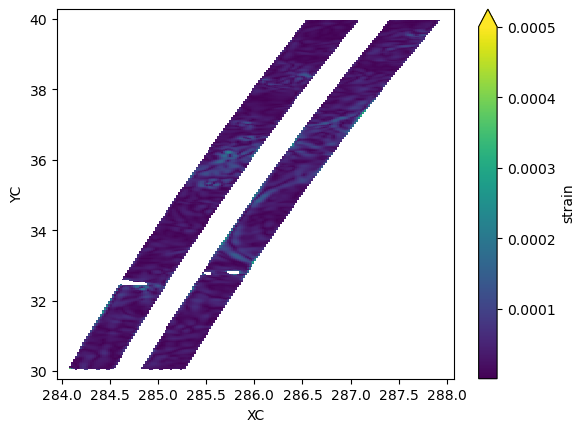

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_552_022_20230615T034415_20230615T043521_v0.1.zarr
<xarray.DataArr

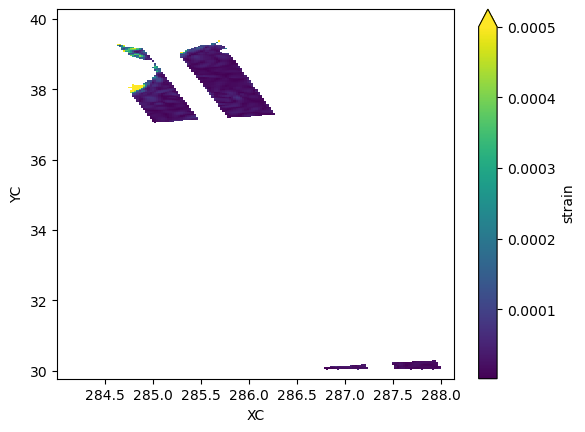

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_553_009_20230615T163039_20230615T172145_v0.1.zarr
<xarray.DataAr

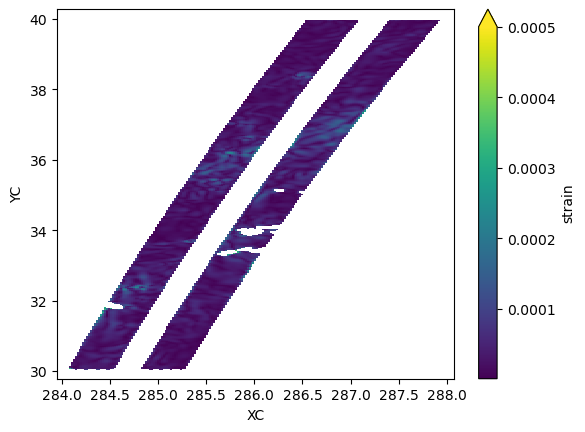

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_553_022_20230616T033453_20230616T042558_v0.1.zarr
<xarray.DataArr

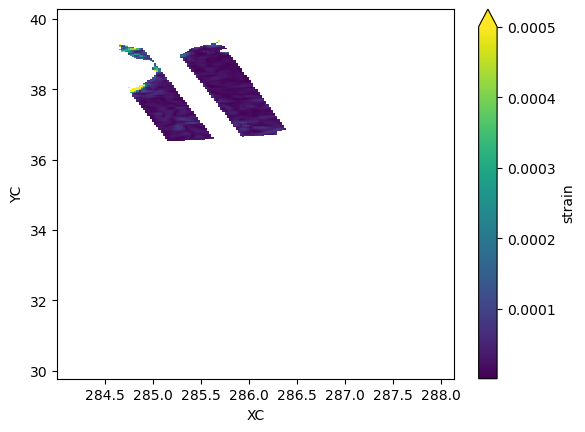

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_554_009_20230616T162117_20230616T171222_v0.1.zarr
<xarray.DataAr

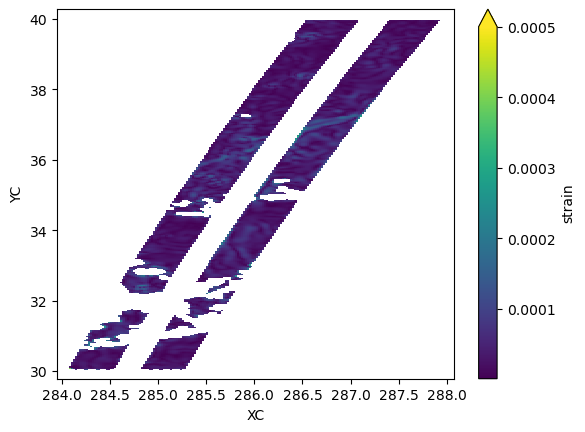

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_554_022_20230617T032531_20230617T041636_v0.1.zarr
<xarray.DataArr

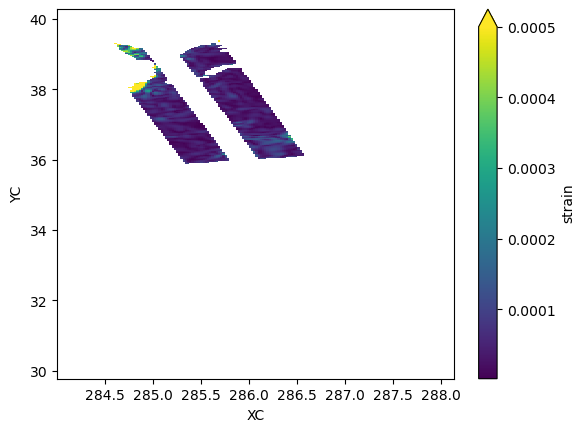

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_555_009_20230617T161155_20230617T170300_v0.1.zarr
<xarray.DataAr

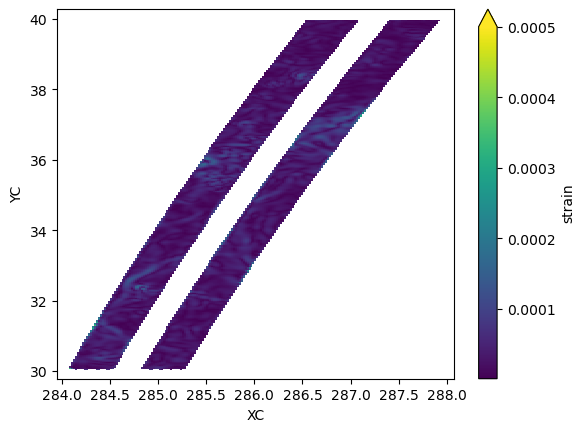

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_555_022_20230618T031609_20230618T040714_v0.1.zarr
<xarray.DataArr

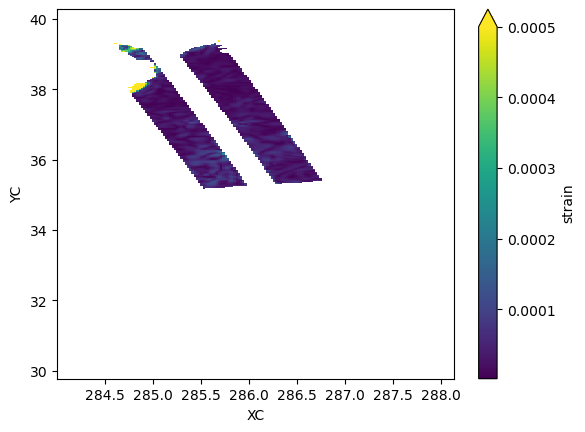

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_556_009_20230618T160233_20230618T165338_v0.1.zarr
<xarray.DataAr

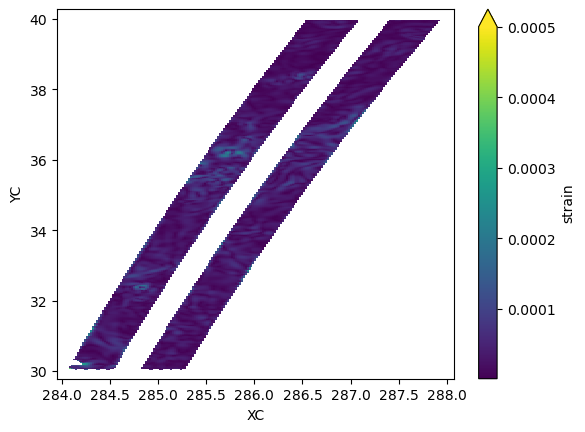

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_556_022_20230619T030647_20230619T035752_v0.1.zarr
<xarray.DataArr

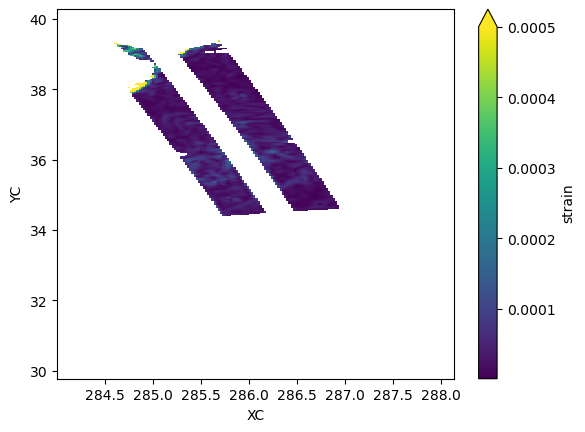

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_557_009_20230619T155311_20230619T164417_v0.1.zarr
<xarray.DataAr

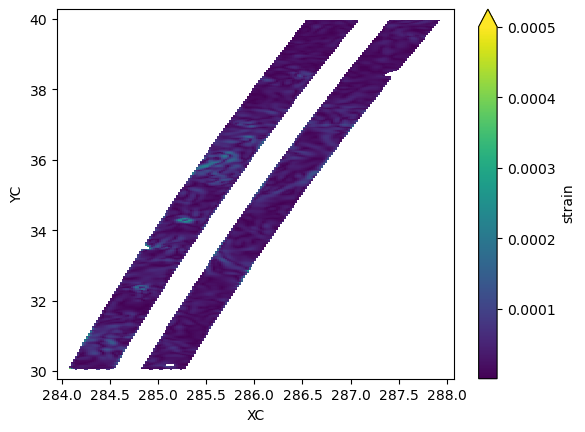

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_557_022_20230620T025725_20230620T034830_v0.1.zarr
<xarray.DataArr

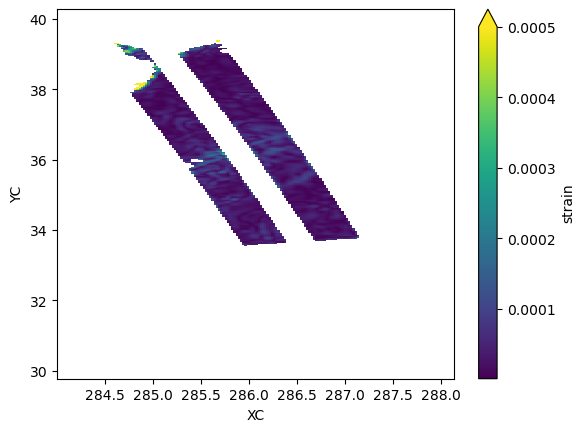

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_558_009_20230620T154349_20230620T163455_v0.1.zarr
<xarray.DataAr

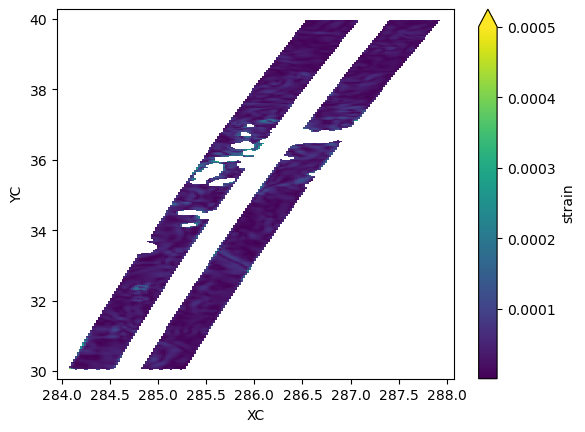

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_559_009_20230621T153427_20230621T162533_v0.1.zarr
<xarray.DataArr

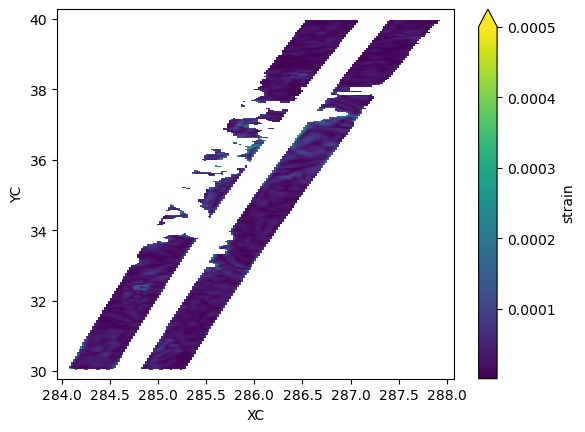

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_559_022_20230622T023841_20230622T032946_v0.1.zarr
<xarray.DataArr

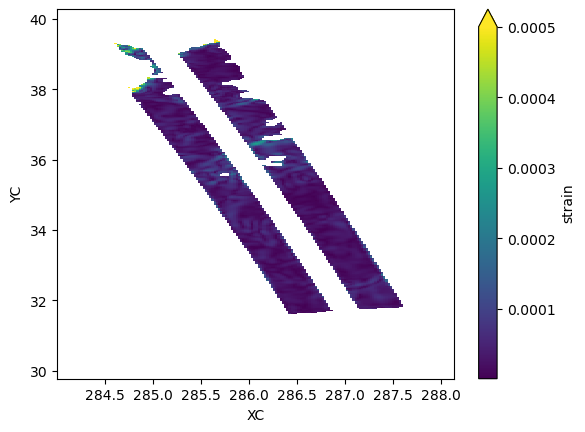

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_560_009_20230622T152505_20230622T161611_v0.1.zarr
<xarray.DataAr

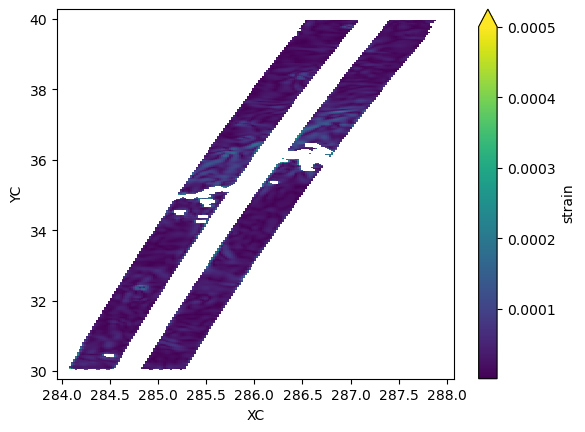

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_560_022_20230623T022919_20230623T032024_v0.1.zarr
<xarray.DataArr

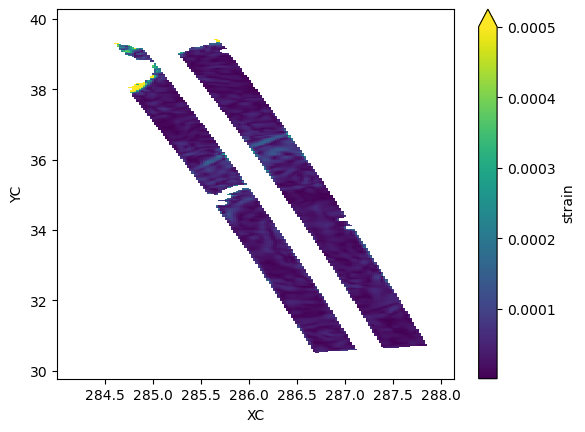

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_561_009_20230623T151543_20230623T160649_v0.1.zarr
<xarray.DataAr

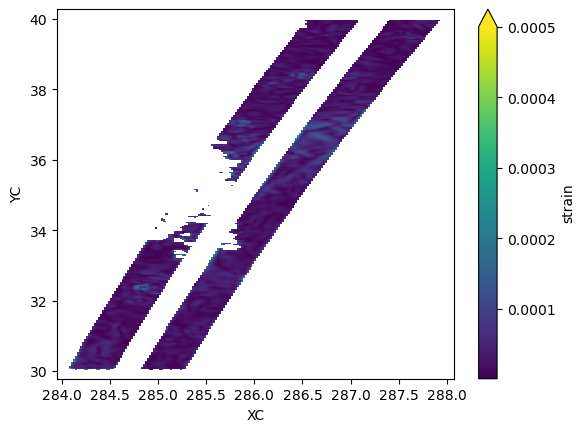

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_562_022_20230625T021035_20230625T030140_v0.1.zarr
<xarray.DataArr

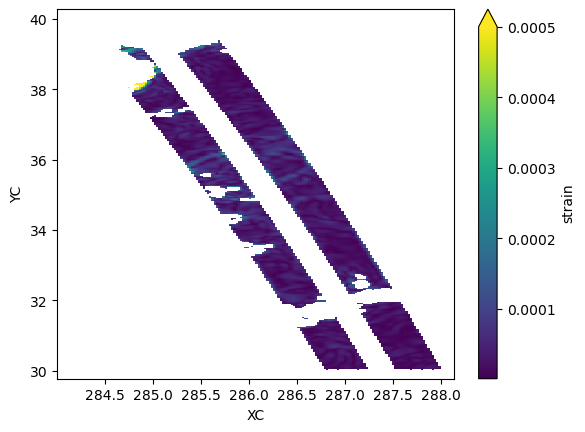

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_563_009_20230625T145659_20230625T154804_v0.1.zarr
<xarray.DataAr

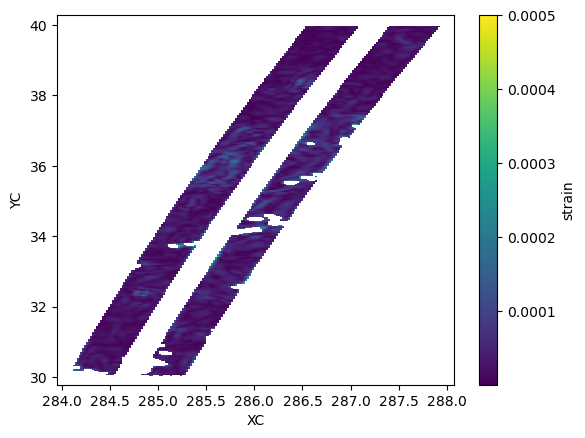

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_563_022_20230626T020113_20230626T025218_v0.1.zarr
<xarray.DataArr

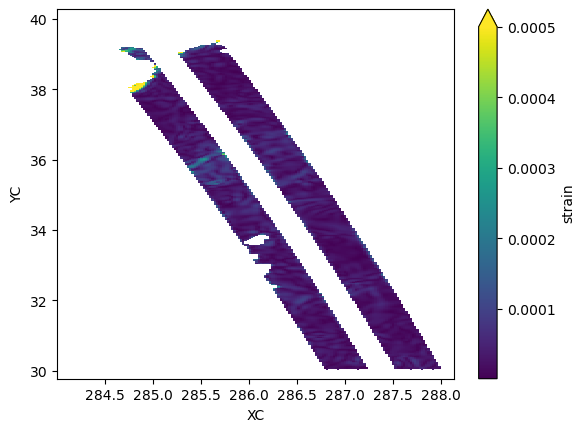

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_564_009_20230626T144737_20230626T153842_v0.1.zarr
<xarray.DataAr

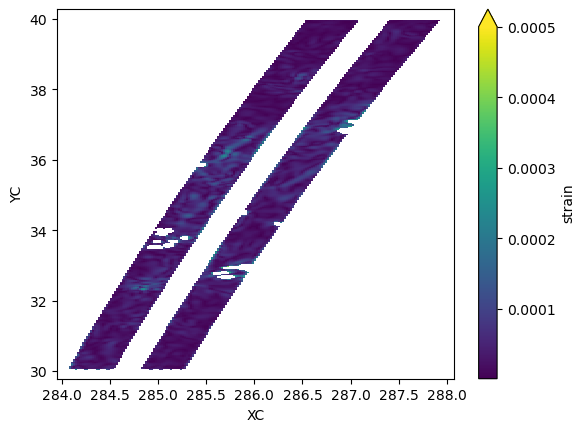

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_565_022_20230628T014228_20230628T023334_v0.1.zarr
<xarray.DataArr

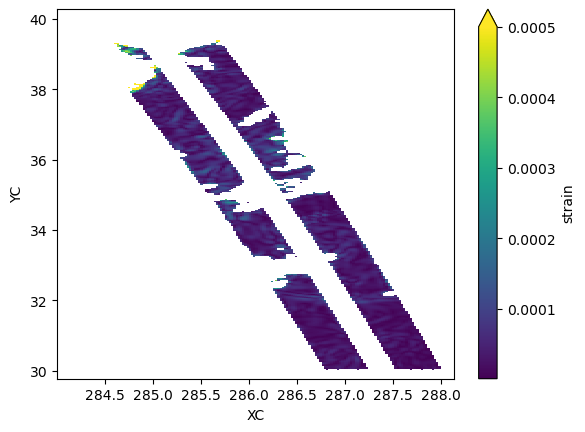

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_566_009_20230628T142853_20230628T151958_v0.1.zarr
<xarray.DataAr

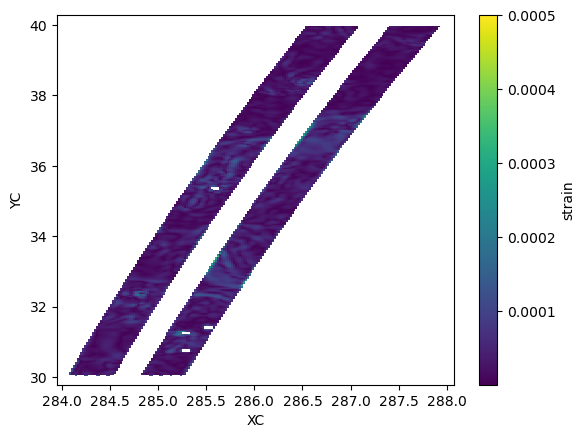

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_566_022_20230629T013306_20230629T022412_v0.1.zarr
<xarray.DataArr

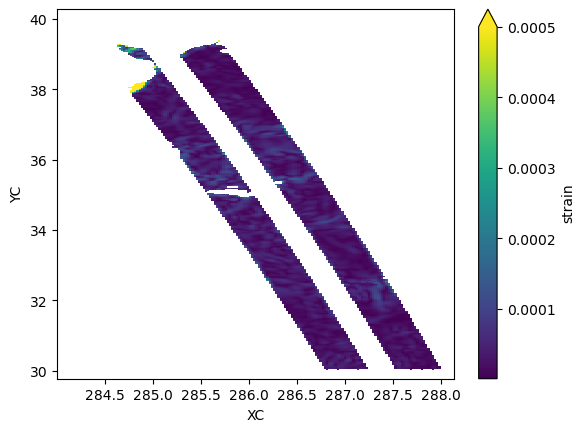

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_567_009_20230629T141931_20230629T151036_v0.1.zarr
<xarray.DataAr

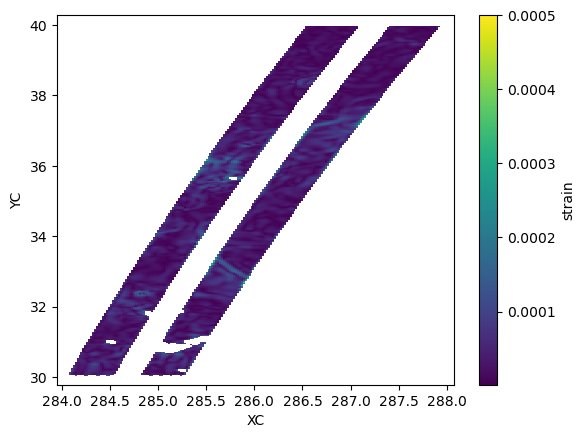

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_567_022_20230630T012344_20230630T021450_v0.1.zarr
<xarray.DataArr

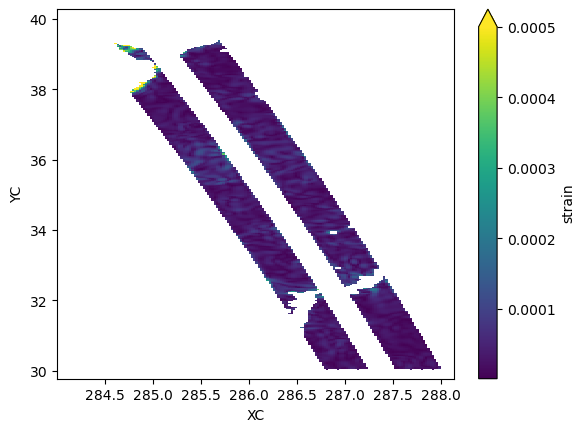

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_568_009_20230630T141008_20230630T150114_v0.1.zarr
<xarray.DataAr

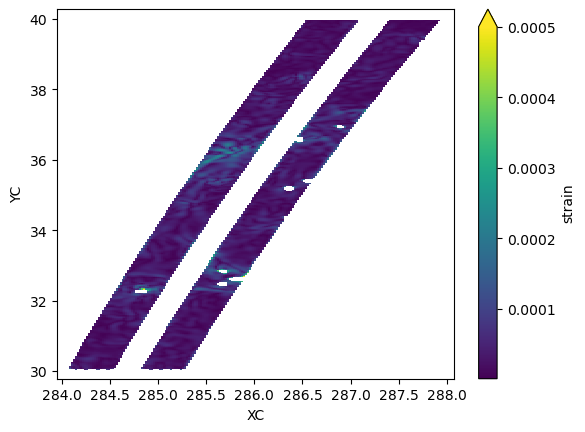

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_568_022_20230701T011422_20230701T020527_v0.1.zarr
<xarray.DataArr

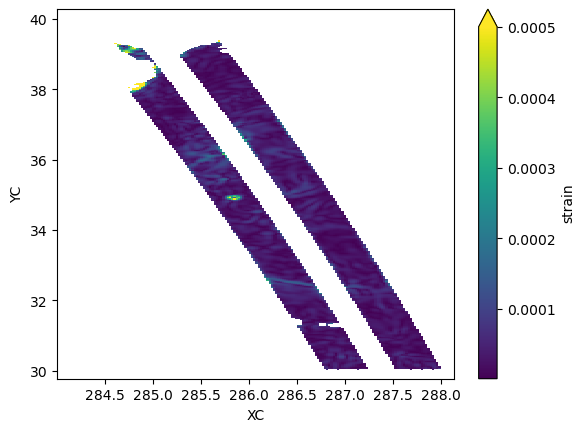

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_569_009_20230701T140046_20230701T145152_v0.1.zarr
<xarray.DataAr

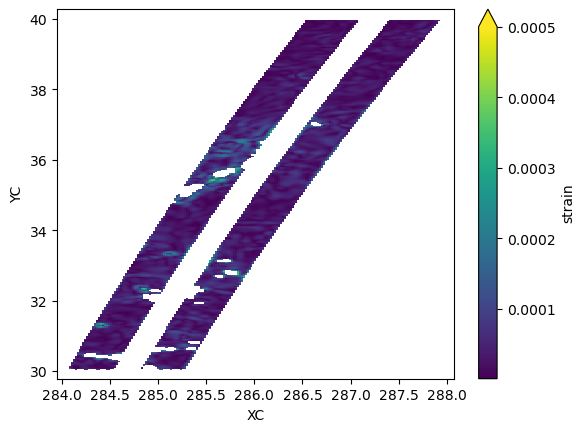

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_569_022_20230702T010500_20230702T015605_v0.1.zarr
<xarray.DataArr

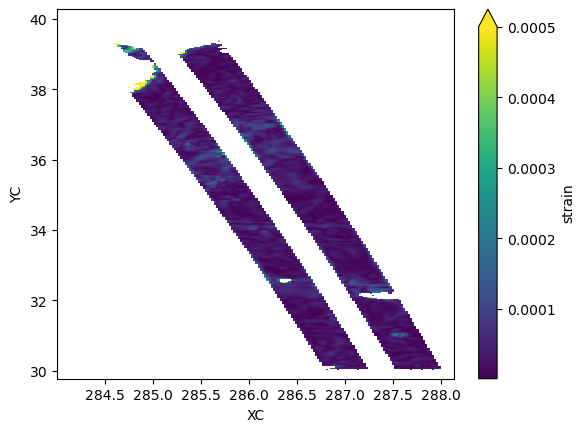

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_570_009_20230702T135125_20230702T144230_v0.1.zarr
<xarray.DataAr

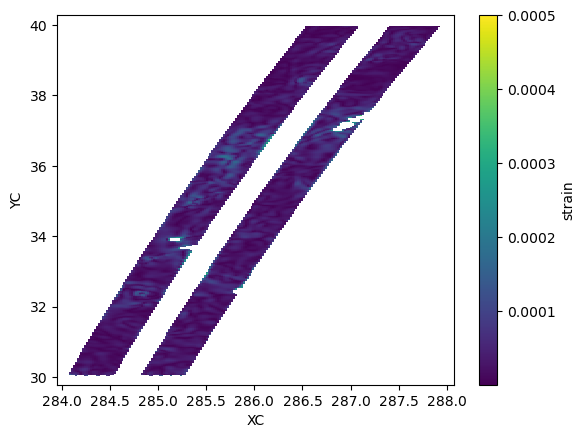

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_570_022_20230703T005538_20230703T014644_v0.1.zarr
<xarray.DataArr

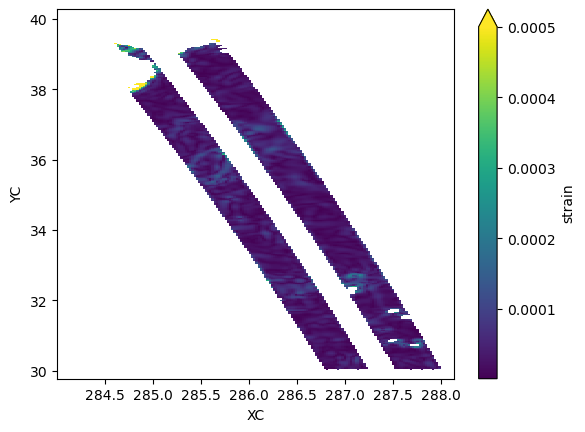

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_571_009_20230703T134203_20230703T143308_v0.1.zarr
<xarray.DataAr

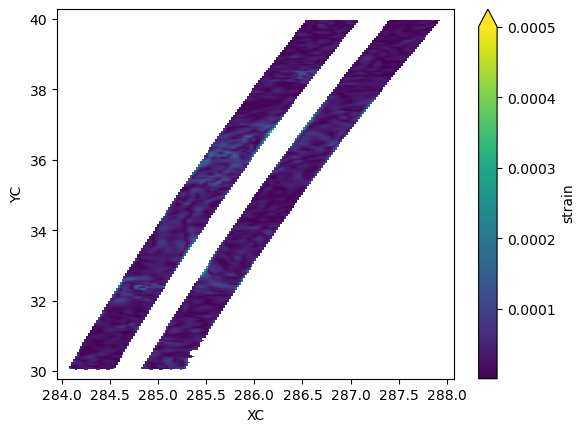

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_571_022_20230704T004616_20230704T013722_v0.1.zarr
<xarray.DataArr

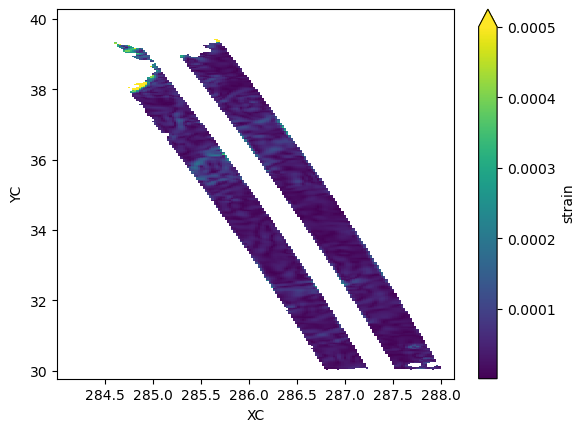

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_572_022_20230705T003654_20230705T012800_v0.1.zarr
<xarray.DataAr

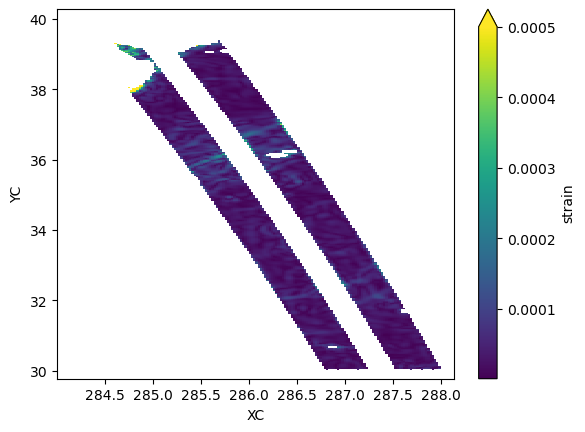

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_573_022_20230706T002732_20230706T011837_v0.1.zarr
<xarray.DataAr

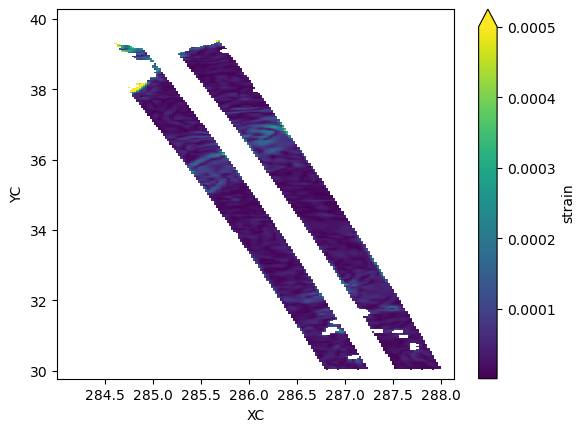

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_575_009_20230707T130434_20230707T135539_v0.1.zarr
<xarray.DataAr

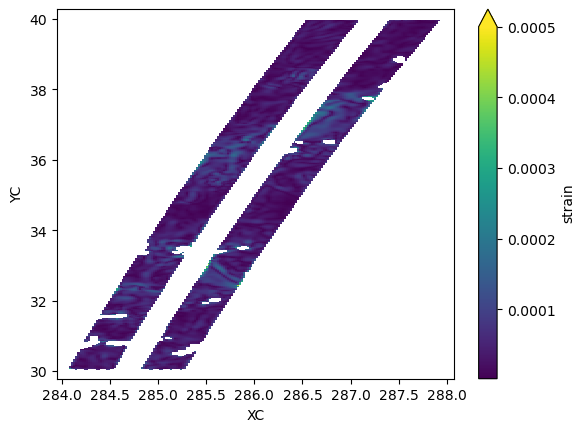

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_575_022_20230708T000848_20230708T005953_v0.1.zarr
<xarray.DataArr

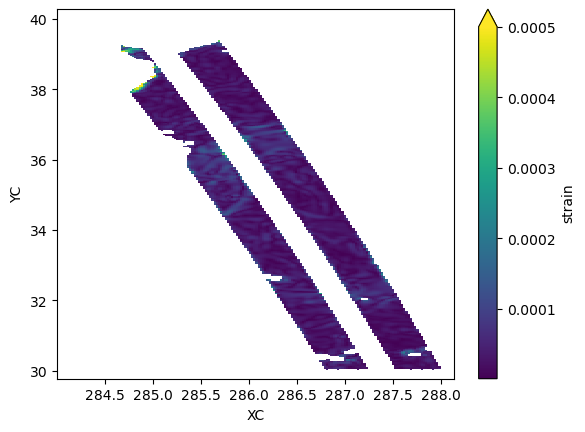

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_576_022_20230708T235926_20230709T005031_v0.1.zarr
<xarray.DataAr

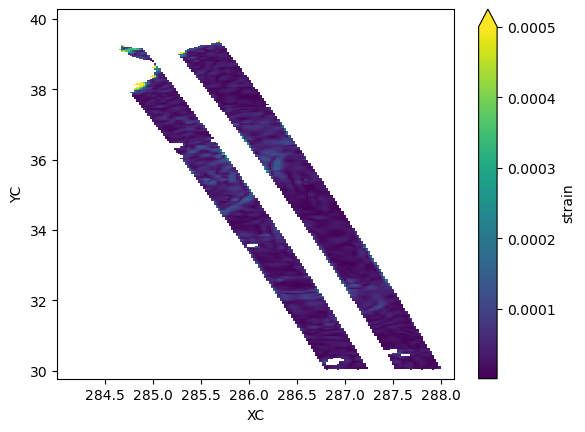

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_577_009_20230709T124550_20230709T133655_v0.1.zarr
<xarray.DataAr

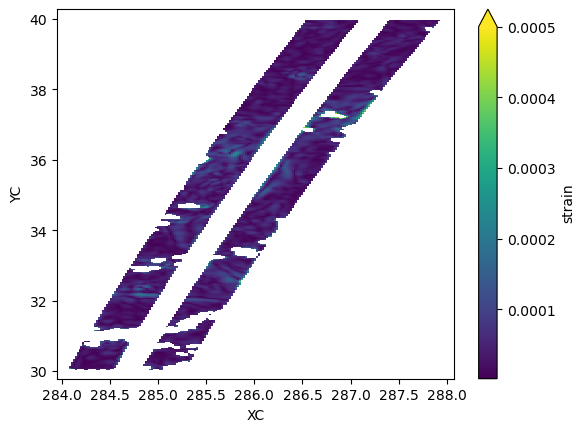

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_577_022_20230709T235003_20230710T004109_v0.1.zarr
<xarray.DataArr

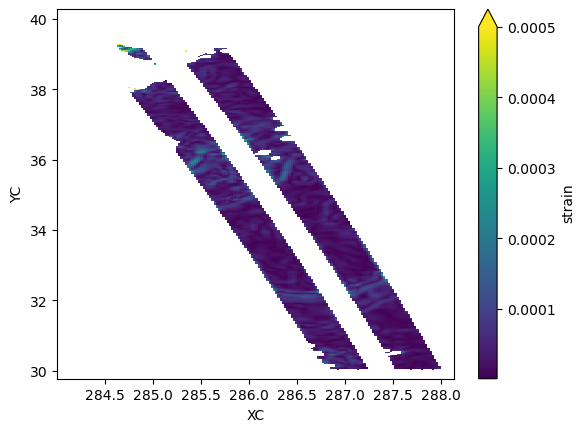

<xarray.Dataset>
Dimensions:  (YC: 592, XC: 180, YF: 591, XF: 179)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.78
  * XC       (XC) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.84 29.83 29.81 29.79
  * XF       (XF) float64 288.1 288.1 288.1 288.0 ... 284.1 284.1 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(592, 180), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(591, 180), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(592, 179), meta=np.ndarray>
/bettik/uchidat/SWOT/GulfStream/SWOT_L3_LR_SSH_Basic_578_009_20230710T123628_20230710T132733_v0.1.zarr
<xarray.DataAr

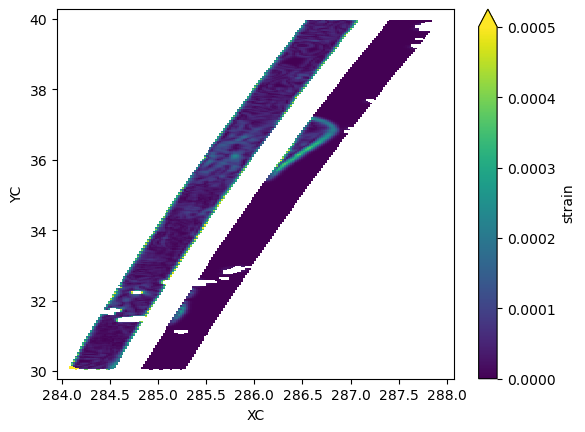

<xarray.Dataset>
Dimensions:  (YC: 601, XC: 203, YF: 600, XF: 202)
Coordinates:
  * YC       (YC) float64 40.27 40.26 40.24 40.22 ... 29.84 29.82 29.8 29.79
  * XC       (XC) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
  * YF       (YF) float64 40.27 40.25 40.23 40.21 ... 29.85 29.83 29.81 29.8
  * XF       (XF) float64 288.1 288.0 288.0 288.0 ... 284.0 284.0 284.0 284.0
    lon      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    lat      (YC, XC) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    vort     (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    strain   (YC, XC) float64 dask.array<chunksize=(601, 203), meta=np.ndarray>
    u        (YF, XC) float64 dask.array<chunksize=(600, 203), meta=np.ndarray>
    v        (YC, XF) float64 dask.array<chunksize=(601, 202), meta=np.ndarray>


In [7]:
grav = 9.807

for i in range(len(fnames)):
# for i in range(10):
    dname = op.join(savedir, 
                    'GulfStream/' + fbase + fnames[i]
                   )[:-3] + '.zarr'
    if op.exists(dname):
        print(dname)
        ds = xr.open_zarr(dname)
        
        if ds.longitude[-1,0].values > ds.longitude[0,-1].values:
            yy, xx = np.mgrid[ds.latitude.max(skipna=True).values:ds.latitude.min(skipna=True).values:-np.abs(ds.latitude.diff('num_lines').min(skipna=True).values),
                  ds.longitude.max(skipna=True).values:ds.longitude.min(skipna=True).values:-np.abs(ds.longitude.diff('num_pixels').min(skipna=True).values)
                 ]
        else:
            yy, xx = np.mgrid[ds.latitude.min(skipna=True).values:ds.latitude.max(skipna=True).values:np.abs(ds.latitude.diff('num_lines').min(skipna=True).values),
                  ds.longitude.min(skipna=True).values:ds.longitude.max(skipna=True).values:np.abs(ds.longitude.diff('num_pixels').min(skipna=True).values)
                 ]
        lon = griddata((ds.latitude.values.flatten(), ds.longitude.values.flatten()), 
                       ds.longitude.values.flatten(), 
                       (yy, xx), method='linear'
                      )
        lat = griddata((ds.latitude.values.flatten(), ds.longitude.values.flatten()), 
                       ds.latitude.values.flatten(), 
                       (yy, xx), method='linear'
                      )
        ssh = griddata((ds.latitude.values.flatten(), ds.longitude.values.flatten()), 
                       ds.ssha_noiseless.values.flatten(), 
                       (yy, xx), method='linear'
                      )
        dss = xr.DataArray(ssh, dims=['YC','XC'], 
                           coords={'YC':np.mean(yy, axis=1),
                                   'XC':np.mean(xx, axis=0)}
                          ).to_dataset(name='ssh')

        dx = gsw.distance(lon, lat, p=0, axis=-1)
        dy = gsw.distance(lon, lat, p=0, axis=0)
        dss['dxC'] = xr.DataArray(dx, dims=['YC','XF'],
                          coords={'YC':np.mean(yy, axis=1),
                                  'XF':np.mean(.5*(xx[:,1:] + xx[:,:-1]), axis=0)}
                     )
        dss['dyC'] = xr.DataArray(dy, dims=['YF','XC'],
                          coords={'YF':np.mean(.5*(yy[1:] + yy[:-1]), axis=1),
                                  'XC':np.mean(xx, axis=0)}
                     )

        coords={
                'X':{'center':'XC', 'inner':'XF'}, 
                'Y':{'center':'YC', 'inner':'YF'},
               }
        grid = Grid(dss, periodic=[], coords=coords)

        dxG = grid.interp(grid.interp(dss.dxC,'X',boundary='extend'),
                          'Y',boundary='extend',to='inner')
        dyG = grid.interp(grid.interp(dss.dyC,'X',boundary='extend',to='inner'),
                          'Y',boundary='extend')
        dxF = grid.interp(dss.dxC,'X',boundary='extend')
        dyF = grid.interp(dss.dyC,'Y',boundary='extend')

        mask = ~np.ma.masked_invalid(dss.ssh).mask

        wet_mask = xr.DataArray(np.zeros((len(dss.YC),len(dss.XC))),
                                dims=['YC','XC'],
                                coords={'YC':dss.YC,'XC':dss.XC}
                   )
        wet_mask[1:-1,1:-1] = mask[1:-1,1:-1].astype(np.float64)

        area = (dxF * dyF)

        dxw = xr.DataArray(np.pad(dss.dxC.data, ((0,0),(0,1)), 'edge'),
                           dims=area.dims, coords=area.coords
                          ) # x-spacing centered at western cell edge
        
        dyw = xr.DataArray(np.pad(dyG.data, ((0,0),(0,1)), 'edge'),
                           dims=area.dims, coords=area.coords
                          ) # y-spacing centered at western cell edge
        
        dxs = xr.DataArray(np.pad(dxG.data, ((0,1),(0,0)), 'edge'),
                           dims=area.dims, coords=area.coords
                          ) # x-spacing centered at southern cell edge
        
        dys = xr.DataArray(np.pad(dss.dyC.data, ((0,1),(0,0)), 'edge'),
                           dims=area.dims, coords=area.coords
                          ) # y-spacing centered at southern cell edge
        
        dx_min = min(dxw.min(), dyw.min(), dxs.min(), dys.min())
        dx_min = dx_min.values
        
        kappa_w = xr.ones_like(wet_mask)
        kappa_s = xr.ones_like(wet_mask)

        filter_scale = 10_000
        filt_mask = wet_mask.chunk({'YC':-1,'XC':-1}).reset_coords(drop=True)
        
        filter = gcm_filters.Filter(
                filter_scale=filter_scale,
                dx_min=dx_min,
            #     n_steps=36,
                filter_shape=gcm_filters.FilterShape.GAUSSIAN,
                grid_type=gcm_filters.GridType.IRREGULAR_WITH_LAND,
                grid_vars={
                    'wet_mask': filt_mask, 
                    'dxw': dxw.chunk({'YC':-1,'XC':-1}), 'dyw': dyw.chunk({'YC':-1,'XC':-1}), 
                    'dxs': dxs.chunk({'YC':-1,'XC':-1}), 'dys': dys.chunk({'YC':-1,'XC':-1}), 
                    'area': area.chunk({'YC':-1,'XC':-1}), 
                    'kappa_w': kappa_w.chunk({'YC':-1,'XC':-1}), 
                    'kappa_s': kappa_s.chunk({'YC':-1,'XC':-1})
                }
            )
        sshm = filter.apply(dss.ssh.chunk({'YC':-1,'XC':-1}), 
                    dims=['YC','XC']).reset_coords(drop=True)
        
        cori = xr.apply_ufunc(gsw.f, dss.YC)

        u = -(grav*grid.diff(sshm,'Y',boundary='extend',to='inner') 
              / grid.interp(cori,'Y',boundary='extend',to='inner') / dss.dyC)
        v = (grav*grid.diff(sshm,'X',boundary='extend',to='inner') 
             / cori / dss.dxC)

        # print(u, v)
        # u_x = .25*(u_x[:-1,:-1] + u_x[1:,:-1] + u_x[1:,1:] + u_x[:-1,1:])
        # v_y = .25*(v_y[:-1,:-1] + v_y[1:,:-1] + v_y[1:,1:] + v_y[:-1,1:])

        u_y = grid.diff(u,'Y',boundary='extend') / dyF
        v_x = grid.diff(v,'X',boundary='extend') / dxF
        
        vort = v_x - u_y

        u_x = (grid.diff(u,'X',boundary='extend',to='inner') 
               / grid.interp(dxG,'X',boundary='extend',to='inner'))
        v_y = (grid.diff(v,'Y',boundary='extend',to='inner') 
               / grid.interp(dyG,'Y',boundary='extend',to='inner'))
        
        sn = u_x - v_y
        ss = v_x + u_y
        strain = np.sqrt(grid.interp(grid.interp(sn**2,'Y',boundary='extend'),
                                     'X',boundary='extend') 
                         + ss**2)
        print(vort, strain)
        dsave = vort.to_dataset(name='vort')
        dsave['strain'] = strain
        dsave['u'] = u
        dsave['v'] = v
        dsave.coords['lon'] = xr.DataArray(lon, dims=['YC','XC'],
                                           coords={'YC':np.mean(yy, axis=1),
                                                   'XC':np.mean(xx, axis=0)})
        dsave.coords['lat'] = xr.DataArray(lat, dims=['YC','XC'],
                                           coords={'YC':np.mean(yy, axis=1),
                                                   'XC':np.mean(xx, axis=0)})
        dsave.strain.plot(vmax=5e-4, rasterized=True)
        plt.show()
        print(dsave)
        dsave.chunk({'YC':100,'XC':100,'YF':100,'XF':100}
                   ).to_zarr(op.join(savedir, 
                                     'GulfStream/' + "Geostrophy/" + fnames[i]
                                    )[:-3]
                             + '_10km.zarr', mode='w')
        dsave.close()
        ds.close()

In [9]:
grav = 9.807
 
ii = 0
for i in range(len(fnames)):
    
    dname = op.join(savedir, 
                    'GulfStream/' + "Geostrophy/" + fnames[i]
                   )[:-3] + '_10km.zarr'
    
    if op.exists(dname):
        ds = xr.open_zarr(dname)
        cori = xr.apply_ufunc(gsw.f, ds.YC.isel(YC=slice(2,-2)), 
                              dask='parallelized')
        mask = xr.DataArray(~np.ma.masked_invalid(ds.vort).mask, 
                            dims=ds.vort.dims,
                            coords=ds.vort.coords
                           ).isel(YC=slice(2,-2),XC=slice(2,-2)
                                 ).stack(Z=("XC", "YC"))
        if ii == 0:
            zeta = (ds.vort.isel(YC=slice(2,-2),XC=slice(2,-2)) 
                    / cori).stack(Z=("XC", "YC")).where(mask, drop=True)
            alpha = (ds.strain.isel(YC=slice(2,-2),XC=slice(2,-2)) 
                     / cori).stack(Z=("XC", "YC")).where(mask, drop=True)
            print(zeta,alpha)
        else:
            zeta = xr.concat([zeta, (ds.vort.isel(YC=slice(2,-2),XC=slice(2,-2)) / cori
                                    ).stack(Z=("XC", "YC")).where(mask, drop=True)
                             ], 'Z')
            alpha = xr.concat([alpha, (ds.strain.isel(YC=slice(2,-2),XC=slice(2,-2)) / cori
                                      ).stack(Z=("XC", "YC")).where(mask, drop=True)
                              ], 'Z')
        
        ds.close()

        ii += 1

<xarray.DataArray (Z: 27122)>
dask.array<where, shape=(27122,), dtype=float64, chunksize=(3958,), chunktype=numpy.ndarray>
Coordinates:
    lat      (Z) float64 dask.array<chunksize=(241,), meta=np.ndarray>
    lon      (Z) float64 dask.array<chunksize=(241,), meta=np.ndarray>
  * Z        (Z) object MultiIndex
  * XC       (Z) float64 287.9 287.9 287.9 287.9 ... 284.1 284.1 284.1 284.1
  * YC       (Z) float64 39.96 39.94 39.92 39.96 ... 30.07 30.05 30.07 30.05 <xarray.DataArray (Z: 27122)>
dask.array<where, shape=(27122,), dtype=float64, chunksize=(3958,), chunktype=numpy.ndarray>
Coordinates:
    lat      (Z) float64 dask.array<chunksize=(241,), meta=np.ndarray>
    lon      (Z) float64 dask.array<chunksize=(241,), meta=np.ndarray>
  * Z        (Z) object MultiIndex
  * XC       (Z) float64 287.9 287.9 287.9 287.9 ... 284.1 284.1 284.1 284.1
  * YC       (Z) float64 39.96 39.94 39.92 39.96 ... 30.07 30.05 30.07 30.05


In [10]:
histswot = xhist(alpha.rename('strain').chunk({'Z':-1}), 
                 zeta.rename('vort').chunk({'Z':-1}), 
                 bins=[sbins, vbins], density=True
                ).compute()
histswot

<xarray.DataArray 'histogram_strain_vort' (strain_bin: 19, vort_bin: 39)>
array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 1.89464602e-05, 0.00000000e+00,
        0.00000000e+00, 1.89464602e-05, 1.70518142e-04, 4.35768585e-04,
        1.51571682e-03, 4.37663231e-03, 1.29783252e-02, 4.33116081e-02,
        1.47157157e-01, 4.77090815e-01, 1.18457059e+00, 1.89718485e+00,
        1.15107324e+00, 4.90182819e-01, 1.66293081e-01, 5.78056501e-02,
        2.18642151e-02, 6.29022479e-03, 1.93253894e-03, 7.19965488e-04,
        1.89464602e-04, 1.70518142e-04, 1.51571682e-04, 5.68393807e-05,
        1.13678761e-04, 3.78929204e-05, 0.00000000e+00, 1.89464602e-05,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 1.89464602e-05, 1.89464602e-05, 1.13678761e-04,
        2.27357523e-04, 3.59982744e-04, 1.02310885e-03, 2.76618319e-03,
        7.38911949e-03, 1.92306571e-02, 5.15343718e-02, 1.46228780e-01,
        3.89899205e-01, 9.02969348e-01, 1.53146133e+00, 1.81740130e+00,
        1.50741827e+00, 8.76501143e-01, 3.94313730e-01, 1.66634118e-01,
        6.50810908e-02, 2.54829890e-02, 1.03637137e-02, 5.17238364e-03,
        2.31146815e-03, 1.11784115e-03, 9.66269471e-04, 6.06286727e-04,
        3.22089824e-04, 4.54715045e-04, 9.47323011e-05, 7.57858409e-05,
        9.47323011e-05, 1.32625222e-04, 5.68393807e-05],
...
       [9.47323011e-05, 1.13678761e-04, 1.13678761e-04, 1.89464602e-04,
        2.08411062e-04, 2.27357523e-04, 3.22089824e-04, 3.59982744e-04,
        1.13678761e-04, 1.51571682e-04, 1.51571682e-04, 1.13678761e-04,
        7.57858409e-05, 1.13678761e-04, 1.51571682e-04, 1.51571682e-04,
        2.08411062e-04, 2.27357523e-04, 2.27357523e-04, 1.89464602e-04,
        2.08411062e-04, 2.08411062e-04, 1.89464602e-04, 2.65250443e-04,
        1.89464602e-04, 1.51571682e-04, 1.89464602e-04, 1.70518142e-04,
        2.08411062e-04, 1.70518142e-04, 3.41036284e-04, 3.59982744e-04,
        2.84196903e-04, 3.97875665e-04, 3.03143363e-04, 2.84196903e-04,
        4.35768585e-04, 4.35768585e-04, 2.46303983e-04],
       [9.47323011e-05, 1.51571682e-04, 9.47323011e-05, 9.47323011e-05,
        9.47323011e-05, 1.13678761e-04, 1.70518142e-04, 1.89464602e-04,
        1.32625222e-04, 7.57858409e-05, 9.47323011e-05, 3.78929204e-05,
        7.57858409e-05, 3.78929204e-05, 9.47323011e-05, 1.13678761e-04,
        1.13678761e-04, 1.13678761e-04, 1.51571682e-04, 9.47323011e-05,
        1.51571682e-04, 2.08411062e-04, 1.70518142e-04, 1.32625222e-04,
        1.13678761e-04, 1.32625222e-04, 1.89464602e-04, 9.47323011e-05,
        2.46303983e-04, 1.13678761e-04, 1.89464602e-04, 1.32625222e-04,
        1.89464602e-04, 1.32625222e-04, 7.57858409e-05, 2.84196903e-04,
        3.59982744e-04, 2.46303983e-04, 1.13678761e-04]])
Coordinates:
  * strain_bin  (strain_bin) float64 0.1053 0.3158 0.5263 ... 3.474 3.684 3.895
  * vort_bin    (vort_bin) float64 -3.897 -3.692 -3.487 ... 3.487 3.692 3.897

/tmp/ipykernel_1267660/386353637.py:7: UserWarning: Log scale: values of z <= 0 have been masked
  im = ax.contourf(histswot.vort_bin,
/tmp/ipykernel_1267660/386353637.py:15: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in im.collections:


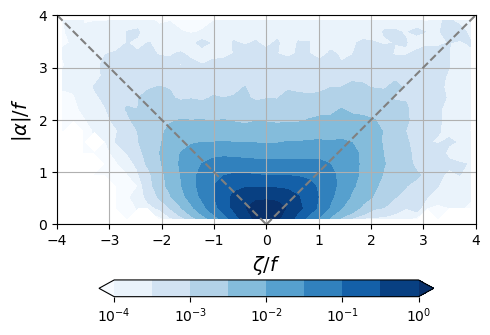

In [11]:
from matplotlib import ticker
import matplotlib.colors as clr

fig, ax = plt.subplots(figsize=(5,4))
fig.set_tight_layout(True)

im = ax.contourf(histswot.vort_bin,
                 histswot.strain_bin,
                 histswot, 
                 cmap='Blues', locator=ticker.LogLocator(), 
                 norm=clr.LogNorm(), levels=np.logspace(-4,0,9),
                 extend='both'
#                       rasterized=True
               )
for c in im.collections:
    c.set_rasterized(True)

ax.plot(np.linspace(0,4,5),np.linspace(0,4,5),c='grey',ls='--')
ax.plot(np.linspace(-4,0,5),np.linspace(4,0,5),c='grey',ls='--')

ax.set_xlim([-4,4])
ax.set_ylim([0,4])

ax.set_xlabel(r"$\zeta/f$", fontsize=14)
ax.set_ylabel(r"$|\alpha|/f$", fontsize=14)

ax.grid(True)
ax.set_aspect('equal')

cbar = fig.colorbar(im, orientation='horizontal', ax=ax, shrink=.8, ticks=[1e-4,1e-3,1e-2,1e-1,1e0])

plt.savefig(op.join(savedir,'Figs/vort-strain-jointPDF_10km.pdf'))